# Business Case: Yulu - Hypothesis Testing

### About Yulu:
* Yulu is India’s leading micro-mobility service provider, which offers unique vehicles for the daily commute. Starting off as a mission to eliminate traffic congestion in India, Yulu provides the safest commute solution through a user-friendly mobile app to enable shared, solo and sustainable commuting.

* Yulu zones are located at all the appropriate locations (including metro stations, bus stands, office spaces, residential areas, corporate offices, etc) to make those first and last miles smooth, affordable, and convenient!

* Yulu has recently suffered considerable dips in its revenues. They have contracted a consulting company to understand the factors on which the demand for these shared electric cycles depends. Specifically, they want to understand the factors affecting the demand for these shared electric cycles in the Indian market.

### Probleam Statments:
* The company wants to know:

1. Which variables are significant in predicting the demand for shared electric cycles in the Indian market?
2. How well those variables describe the electric cycle demands

### Dataset:
Dataset contains following columns
* **datetime:** datetime
* **season:** season (1: spring, 2: summer, 3: fall, 4: winter)
* **holiday:** whether day is a holiday or not
* **workingday:** if day is neither weekend nor holiday is 1, otherwise is 0.
* **weather:**
    * 1: Clear, Few clouds, partly cloudy, partly cloudy
    * 2: Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist
    * 3: Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain + Scattered clouds
    * 4: Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog
* **temp:** temperature in Celsius
* **atemp:** feeling temperature in Celsius
* **humidity:** humidity
* **windspeed:** wind speed
* **casual:** count of casual users
* **registered:** count of registered users
* **count:** count of total rental bikes including both casual and registered

### Analysing basic metrics

In [1]:
#importing different libaries
import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import warnings #to ignore the warnings & make our code more representable
warnings.filterwarnings("ignore")
from scipy.stats import norm
from scipy.stats import t
import scipy.stats as spy

In [2]:
#Loading of dataset
df = pd.read_csv("../scaler/MODULE_04/bike_sharing.csv")
df.head()

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
0,2011-01-01 00:00:00,1,0,0,1,9.84,14.395,81,0.0,3,13,16
1,2011-01-01 01:00:00,1,0,0,1,9.02,13.635,80,0.0,8,32,40
2,2011-01-01 02:00:00,1,0,0,1,9.02,13.635,80,0.0,5,27,32
3,2011-01-01 03:00:00,1,0,0,1,9.84,14.395,75,0.0,3,10,13
4,2011-01-01 04:00:00,1,0,0,1,9.84,14.395,75,0.0,0,1,1


In [3]:
df.shape #to observe shape of data

(10886, 12)

Dataset is of 10886 rows and 12 attributes.

In [4]:
df.info() #to observe the data type 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10886 entries, 0 to 10885
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   datetime    10886 non-null  object 
 1   season      10886 non-null  int64  
 2   holiday     10886 non-null  int64  
 3   workingday  10886 non-null  int64  
 4   weather     10886 non-null  int64  
 5   temp        10886 non-null  float64
 6   atemp       10886 non-null  float64
 7   humidity    10886 non-null  int64  
 8   windspeed   10886 non-null  float64
 9   casual      10886 non-null  int64  
 10  registered  10886 non-null  int64  
 11  count       10886 non-null  int64  
dtypes: float64(3), int64(8), object(1)
memory usage: 1020.7+ KB


In [5]:
df.isna().sum()

datetime      0
season        0
holiday       0
workingday    0
weather       0
temp          0
atemp         0
humidity      0
windspeed     0
casual        0
registered    0
count         0
dtype: int64

There are no missing values in the data.

In [6]:
df.columns

Index(['datetime', 'season', 'holiday', 'workingday', 'weather', 'temp',
       'atemp', 'humidity', 'windspeed', 'casual', 'registered', 'count'],
      dtype='object')

In [7]:
# unique values per columns:
df.nunique()

datetime      10886
season            4
holiday           2
workingday        2
weather           4
temp             49
atemp            60
humidity         89
windspeed        28
casual          309
registered      731
count           822
dtype: int64

## Pre-processing data :

* **season:** season (1: spring, 2: summer, 3: fall, 4: winter)
* **holiday:** whether day is a holiday or not
* **workingday:** if day is neither weekend nor holiday is 1, otherwise is 0.
* **weather:**
    * 1: Clear, Few clouds, partly cloudy, partly cloudy
    * 2: Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist
    * 3: Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain + Scattered clouds
    * 4: Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog

In [8]:
#Updating 'season' column
df["season"].replace({1:"Spring",
                       2:"Summer",
                       3:"Fall",
                       4:"Winter"},inplace=True)
df["season"]

0        Spring
1        Spring
2        Spring
3        Spring
4        Spring
          ...  
10881    Winter
10882    Winter
10883    Winter
10884    Winter
10885    Winter
Name: season, Length: 10886, dtype: object

In [9]:
df['datetime'] = pd.to_datetime(df['datetime'])

In [10]:
# Converting 'season' column's datatype to category
df['season'] = df['season'].astype('category')
df['season']

0        Spring
1        Spring
2        Spring
3        Spring
4        Spring
          ...  
10881    Winter
10882    Winter
10883    Winter
10884    Winter
10885    Winter
Name: season, Length: 10886, dtype: category
Categories (4, object): ['Fall', 'Spring', 'Summer', 'Winter']

In [11]:
# Converting 'holiday' column's datatype to category
df['holiday'] = df['holiday'].astype('category')
df['holiday']

0        0
1        0
2        0
3        0
4        0
        ..
10881    0
10882    0
10883    0
10884    0
10885    0
Name: holiday, Length: 10886, dtype: category
Categories (2, int64): [0, 1]

In [12]:
# Converting 'workingday' column's datatype to category
df['workingday'] = df['workingday'].astype('category')
df['workingday']

0        0
1        0
2        0
3        0
4        0
        ..
10881    1
10882    1
10883    1
10884    1
10885    1
Name: workingday, Length: 10886, dtype: category
Categories (2, int64): [0, 1]

In [13]:
# Converting 'weather' column's datatype to category
df['weather'] = df['weather'].astype('category')
df['weather']

0        1
1        1
2        1
3        1
4        1
        ..
10881    1
10882    1
10883    1
10884    1
10885    1
Name: weather, Length: 10886, dtype: category
Categories (4, int64): [1, 2, 3, 4]

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10886 entries, 0 to 10885
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   datetime    10886 non-null  datetime64[ns]
 1   season      10886 non-null  category      
 2   holiday     10886 non-null  category      
 3   workingday  10886 non-null  category      
 4   weather     10886 non-null  category      
 5   temp        10886 non-null  float64       
 6   atemp       10886 non-null  float64       
 7   humidity    10886 non-null  int64         
 8   windspeed   10886 non-null  float64       
 9   casual      10886 non-null  int64         
 10  registered  10886 non-null  int64         
 11  count       10886 non-null  int64         
dtypes: category(4), datetime64[ns](1), float64(3), int64(4)
memory usage: 723.7 KB


## Statistical summary

In [15]:
df.describe()  #to generate statistical summary of numerical column

,temp,atemp,humidity,windspeed,casual,registered,count
count,10886.00000,10886.000000,10886.000000,10886.000000,10886.000000,10886.000000,10886.000000
mean,20.23086,23.655084,61.886460,12.799395,36.021955,155.552177,191.574132
std,7.79159,8.474601,19.245033,8.164537,49.960477,151.039033,181.144454
min,0.82000,0.760000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,13.94000,16.665000,47.000000,7.001500,4.000000,36.000000,42.000000
50%,20.50000,24.240000,62.000000,12.998000,17.000000,118.000000,145.000000
75%,26.24000,31.060000,77.000000,16.997900,49.000000,222.000000,284.000000
max,41.00000,45.455000,100.000000,56.996900,367.000000,886.000000,977.000000


In [16]:
# for unique list of season, listed in percentage
season = df['season'].value_counts(normalize=True).map(lambda calc: round(100*calc,2)).reset_index()
season.columns = ['season', 'Count']
season

,season,Count
0,Winter,25.11
1,Fall,25.11
2,Summer,25.11
3,Spring,24.67


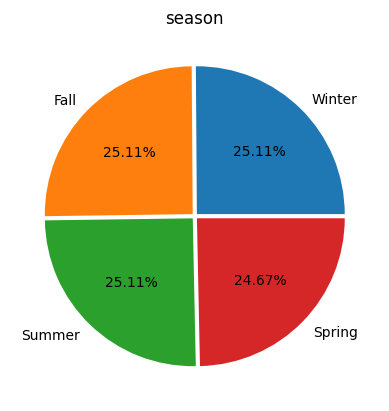

In [17]:
#season analysis using pie chart
plt.pie(x = season.Count, labels = season.season, explode = [0.02,0.02,0.02, 0.02], autopct = '%.2f%%')
plt.title('season')
plt.show()

In [18]:
# for unique list of holiday, listed in percentage
holiday = df['holiday'].value_counts(normalize=True).map(lambda calc: round(100*calc,2)).reset_index()
holiday.columns = ['holiday','Count']
holiday

,holiday,Count
0,0,97.14
1,1,2.86


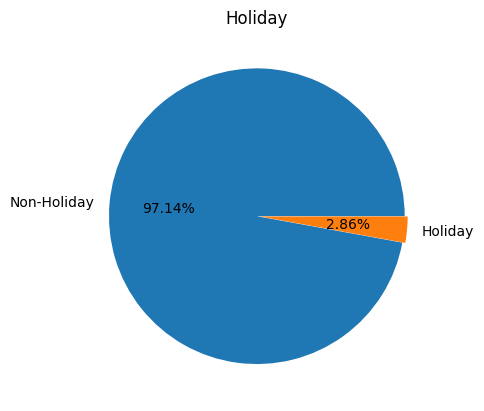

In [19]:
#Holiday analysis using pie chart
plt.pie(x = holiday.Count, labels = ['Non-Holiday','Holiday'], explode = [0,0.02],  autopct = '%.2f%%')
plt.title('Holiday')
plt.show()

In [20]:
# for unique list of workingday, listed in percentage
workingday = df['workingday'].value_counts(normalize=True).map(lambda calc: round(100*calc,2)).reset_index()
workingday.columns=['Workingday','Count']
workingday

,Workingday,Count
0,1,68.09
1,0,31.91


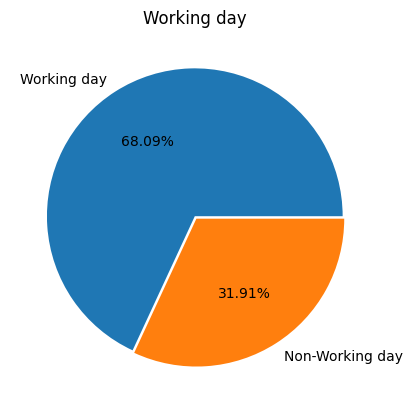

In [21]:
#Working day analysis using pie chart
plt.pie(x = workingday.Count, labels = ['Working day','Non-Working day'], explode = [0,0.02],  autopct = '%.2f%%')
plt.title('Working day')
plt.show()

In [22]:
# for unique list of weather, listed in percentage
weather = df['weather'].value_counts(normalize=True).map(lambda calc: round(100*calc,2)).reset_index()
weather.columns = ['Weather','Count']
weather

,Weather,Count
0,1,66.07
1,2,26.03
2,3,7.89
3,4,0.01


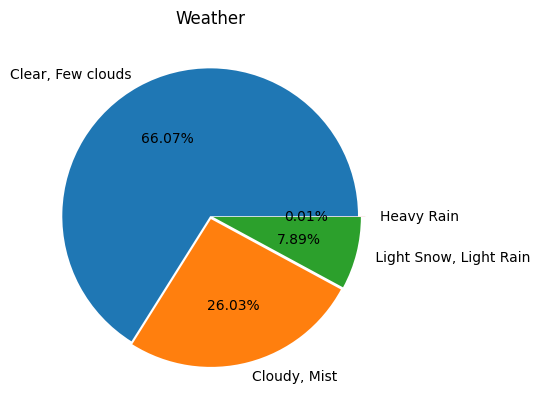

In [23]:
#weather analysis using pie chart
plt.pie(x = weather.Count, labels = ['Clear, Few clouds','Cloudy, Mist',' Light Snow, Light Rain','Heavy Rain'], explode = [0,0.02,0.02,0.05],  autopct = '%.2f%%')
plt.title('Weather')
plt.show()

In [24]:
# for unique list of humidity, listed in percentage
humidity = df['humidity'].value_counts(normalize=True).map(lambda calc: round(100*calc,2)).reset_index()
humidity.columns = ['humidity', 'Count']
humidity

,humidity,Count
0,88,3.38
1,94,2.98
2,83,2.90
3,87,2.65
4,70,2.38
...,...,...
84,8,0.01
85,10,0.01
86,97,0.01
87,96,0.01


In [25]:
# for unique list of humidity, listed in percentage
windspeed = df['windspeed'].value_counts(normalize=True).map(lambda calc: round(100*calc,2)).reset_index()
windspeed.columns = ['windspeed', 'Count']
windspeed

,windspeed,Count
0,0.0000,12.06
1,8.9981,10.29
2,11.0014,9.71
3,12.9980,9.57
4,7.0015,9.50
5,15.0013,8.83
6,6.0032,8.01
7,16.9979,7.57
8,19.0012,6.21
9,19.9995,4.52


## Non-Graphical Analysis

In [26]:
# Total no. of unique seasons
season = df['season'].nunique()
season

4

In [27]:
season = df['season'].unique().tolist()
season

['Spring', 'Summer', 'Fall', 'Winter']

* Four different types of season
    1. Spring
    2. Summer
    3. Fall
    4. Winter

In [28]:
# Total no. of unique holiday
holiday = df['holiday'].unique().tolist()
holiday

[0, 1]

* Holiday:
    * 0: Non-Holiday
    * 1: Holiday

In [29]:
# Total no. of unique weather
weather = df['weather'].unique().tolist()
weather

[1, 2, 3, 4]

* weather:
    * 1: Clear, Few clouds, partly cloudy, partly cloudy
    * 2: Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist
    * 3: Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain + Scattered clouds
    * 4: Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog

In [30]:
# Total no. of unique workingday
workingday = df['workingday'].unique().tolist()
workingday

[0, 1]

* Working day:
    * 0: Non-Working day
    * 1: Working day

In [31]:
# Total no. of unique humidity
humidity = df['humidity'].nunique()
humidity

89

In [32]:
# Total no. of unique windspeed
windspeed = df['windspeed'].nunique()
windspeed

28

In [33]:
# Total no. of unique temp
temp = df['temp'].nunique()
temp

49

In [34]:
# Total no. of unique atemp
atemp = df['atemp'].nunique()
atemp

60

In [35]:
# Total no. of unique casual
casual = df['casual'].nunique()
casual

309

In [36]:
# Total no. of unique registered
registered = df['registered'].nunique()
registered

731

In [37]:
# Total no. of unique count
count = df['count'].nunique()
count

822

In [38]:
# number of unique values in each categorical columns
cat_cols= ['season', 'holiday', 'workingday', 'weather']
df[cat_cols].melt().groupby(['variable', 'value'])[['value']].count()

value
variable   value        
holiday    0       10575
           1         311
season     Fall     2733
           Spring   2686
           Summer   2733
           Winter   2734
weather    1        7192
           2        2834
           3         859
           4           1
workingday 0        3474
           1        7412

In [39]:
df.describe().loc[['min', 'max']]

,temp,atemp,humidity,windspeed,casual,registered,count
min,0.82,0.760,0.0,0.0000,0.0,0.0,1.0
max,41.00,45.455,100.0,56.9969,367.0,886.0,977.0


## Univariate Analysis

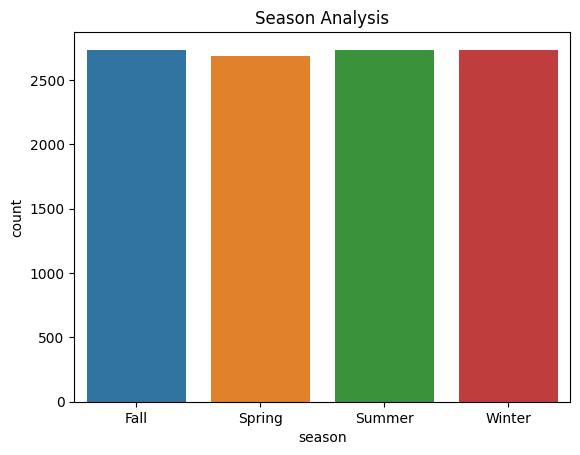

In [40]:
#season Analysis
sns.countplot(data=df,x='season')
plt.title("Season Analysis")
plt.show()

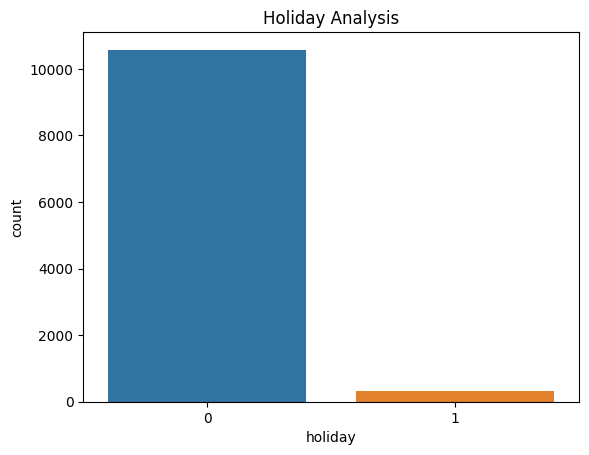

In [41]:
#holiday analysis
sns.countplot(data = df, x = 'holiday')
plt.title("Holiday Analysis")
plt.show()

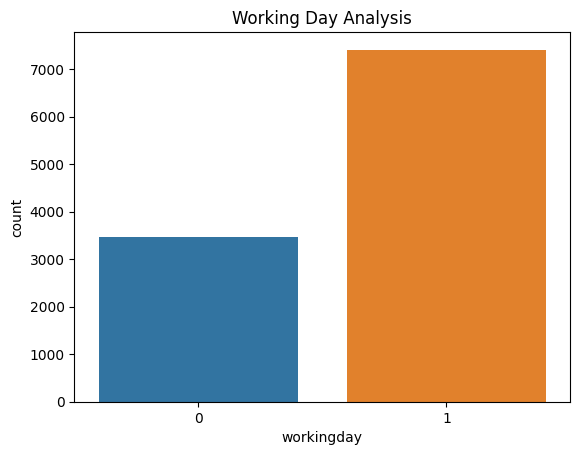

In [42]:
#working day analysis
sns.countplot(data = df, x = 'workingday')
plt.title("Working Day Analysis")
plt.show()

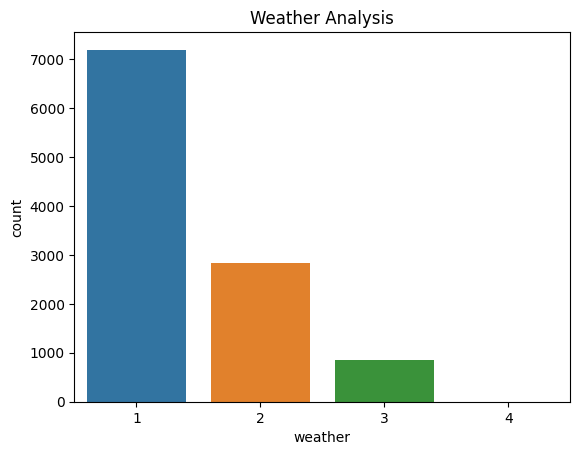

In [43]:
#weather analysis
sns.countplot(data = df, x = 'weather')
plt.title("Weather Analysis")
plt.show() 

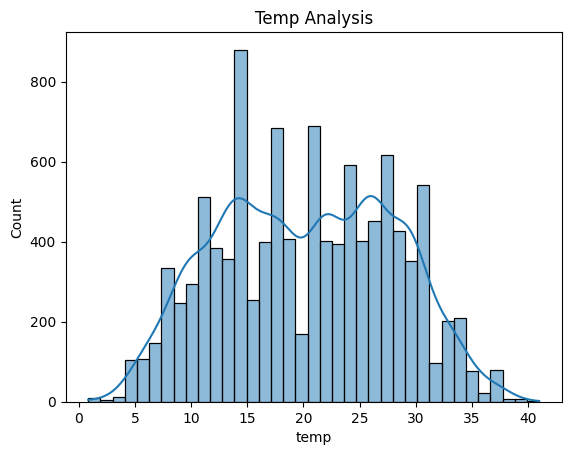

In [44]:
#temp analysis
sns.histplot(data=df,x='temp',kde=True)
plt.title("Temp Analysis")
plt.show()

In [45]:
tempmean = np.round(df['temp'].mean(),2)
tempstd_dev = np.round(df['temp'].std(),2)
tempmean, tempstd_dev 

(20.23, 7.79)

* The average temperature in the "temp" column is 20.23 degrees Celsius, with a standard deviation of 7.79 degrees Celsius.

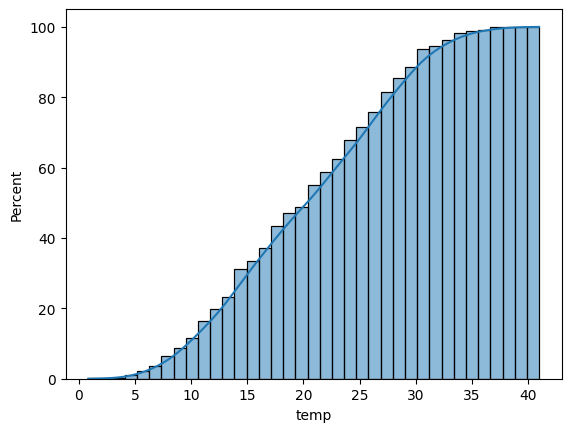

In [46]:
sns.histplot(data = df, x = 'temp', kde = True, cumulative = True, stat = 'percent')
plt.show() 

* More than 80 % of the time, the temperature is less than 28 degrees celcius.

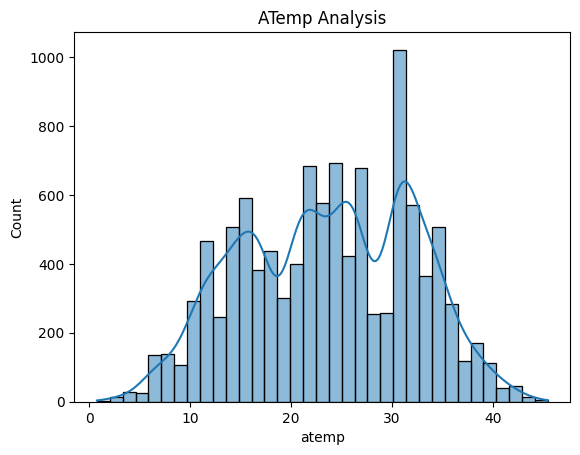

In [47]:
sns.histplot(data=df,x='atemp',kde=True)
plt.title("ATemp Analysis")
plt.show()

In [48]:
atemp_mean = np.round(df['atemp'].mean(),2)
atemp_std = np.round(df['atemp'].std(),2)
atemp_mean, atemp_std 

(23.66, 8.47)

* The average temperature in the "atemp" column is 23.66 degrees Celsius, with a standard deviation of 8.47 degrees Celsius.

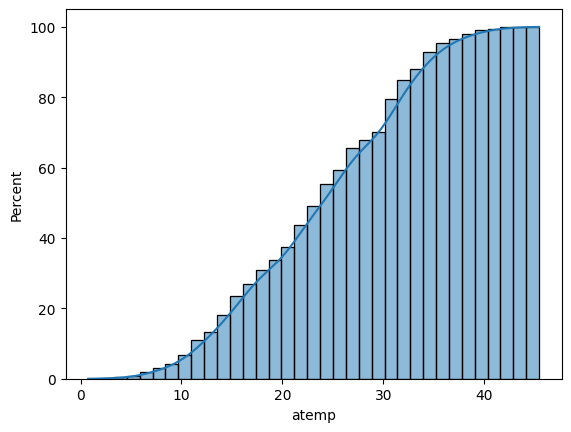

In [49]:
sns.histplot(data = df, x = 'atemp', kde = True, cumulative = True, stat = 'percent')
plt.show() 

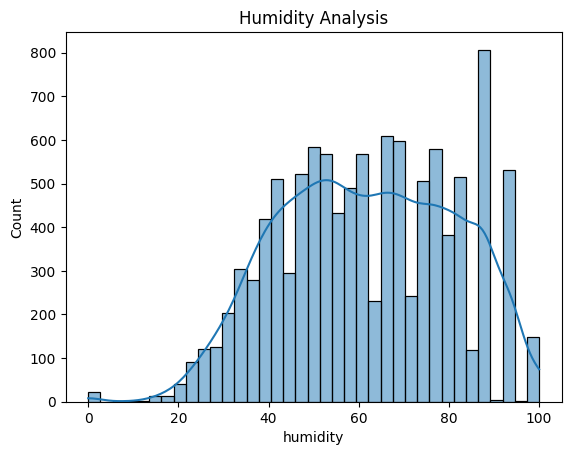

In [50]:
sns.histplot(data=df,x='humidity',kde=True)
plt.title("Humidity Analysis")
plt.show()

In [51]:
humidity_mean = np.round(df['humidity'].mean(),2)
humidity_std = np.round(df['humidity'].std(),2)
humidity_mean, humidity_std 

(61.89, 19.25)

* The average humidity in the "humidity" column is 61.89, with a standard deviation of 19.25.

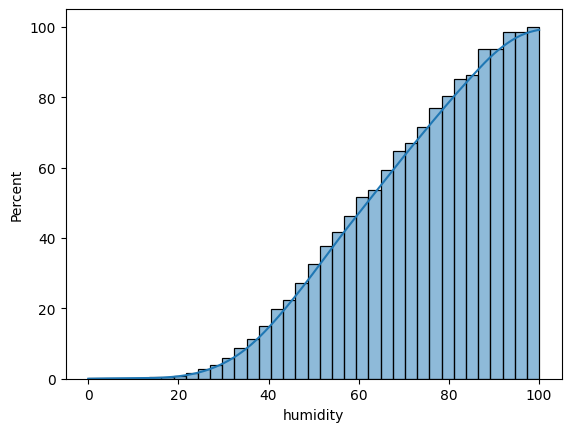

In [52]:
sns.histplot(data = df, x = 'humidity', kde = True, cumulative = True, stat = 'percent')
plt.show() 

* More than 80 % of the time, the humidity value is greater than 40. Thus for most of the time, humidity level varies from optimum to too moist.

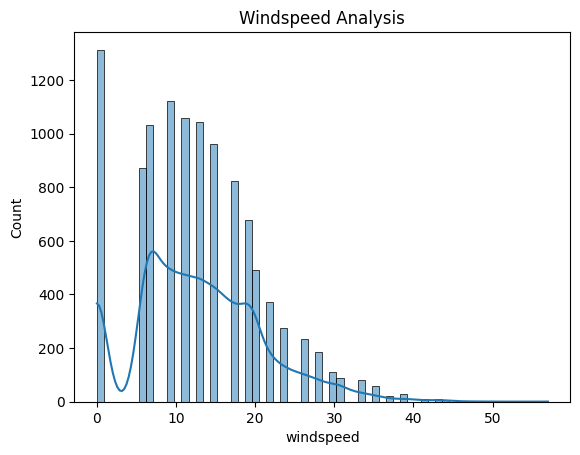

In [53]:
sns.histplot(data=df,x='windspeed',kde=True)
plt.title("Windspeed Analysis")
plt.show()

In [54]:
windspeed_mean = np.round(df['windspeed'].mean(),2)
windspeed_std = np.round(df['windspeed'].std(),2)
windspeed_mean, windspeed_std 

(12.8, 8.16)

* The average windspeed in the "windspeed" column is 12.8, with a standard deviation of 8.16.

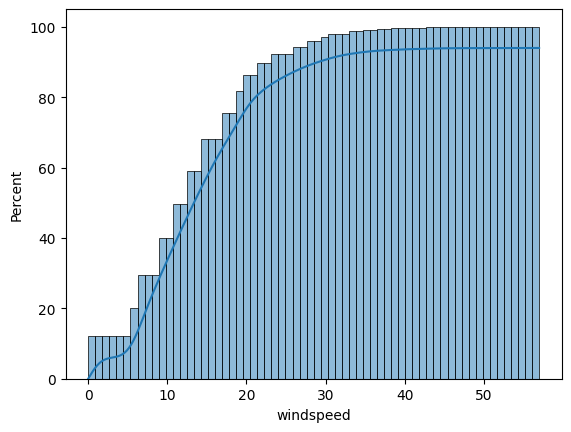

In [55]:
sns.histplot(data = df, x = 'windspeed', kde = True, cumulative = True, stat = 'percent')
plt.show() 

* More than 85 % of the total windspeed data has a value of less than 20.

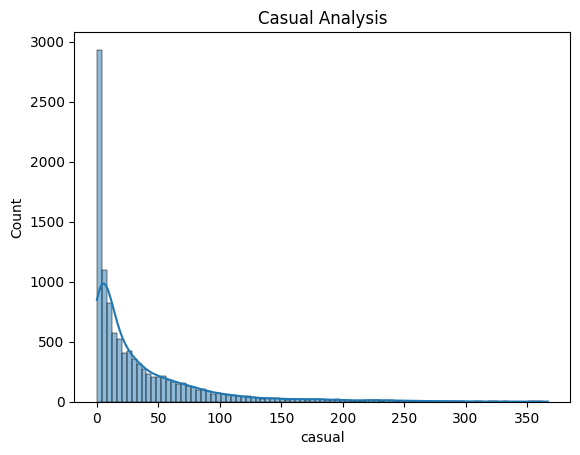

In [56]:
sns.histplot(data=df,x='casual',kde=True)
plt.title("Casual Analysis")
plt.show()

In [57]:
casual_mean = np.round(df['casual'].mean())
casual_std = np.round(df['casual'].std())
casual_mean, casual_std 

(36.0, 50.0)

* The mean and the standard deviation of the casual column is 36.02 and 49.96 respectively.

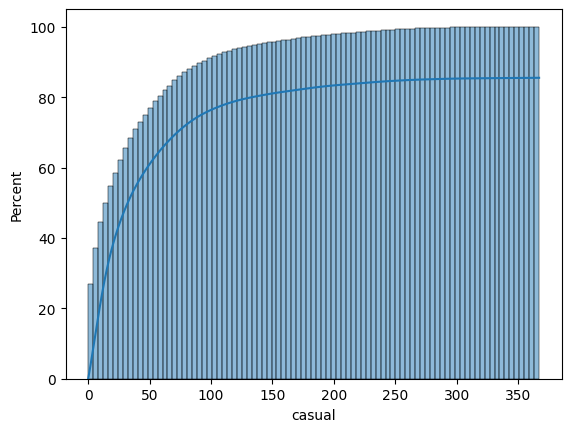

In [58]:
sns.histplot(data = df, x = 'casual', kde = True, cumulative = True, stat = 'percent')
plt.show() 

* More than 80 % of the time, the count of casual users is less than 60.

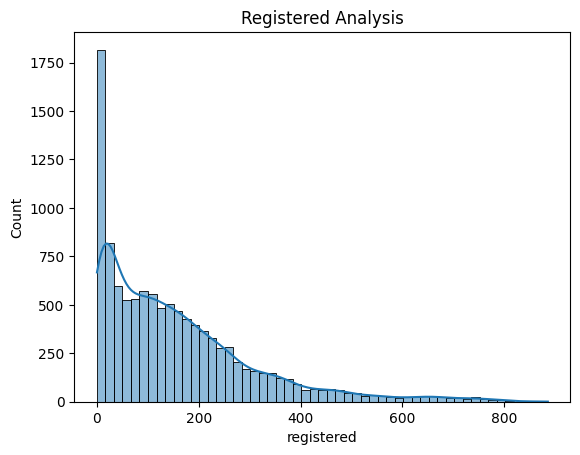

In [59]:
sns.histplot(data=df,x='registered',kde=True)
plt.title("Registered Analysis")
plt.show()

In [60]:
Reg_mean = np.round(df['registered'].mean())
Reg_std = np.round(df['registered'].std())
Reg_mean, Reg_std 

(156.0, 151.0)

* The mean and the standard deviation of the registered column is 155.55 and 151.04 respectively.

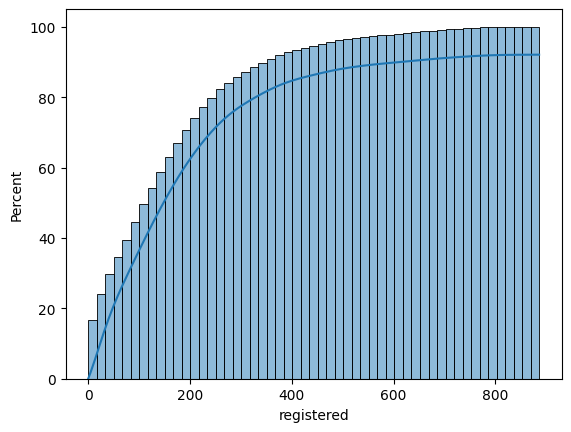

In [61]:
sns.histplot(data = df, x = 'registered', kde = True, cumulative = True, stat = 'percent')
plt.show() 

* More than 85 % of the time, the count of registered users is less than 300.

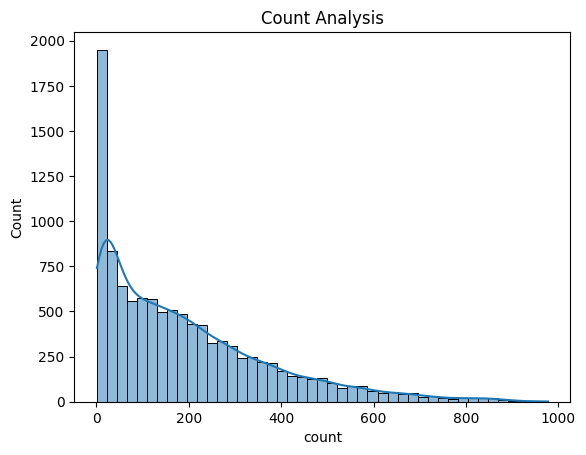

In [62]:
sns.histplot(data=df,x='count',kde=True)
plt.title("Count Analysis")
plt.show()

In [63]:
cnt_mean = np.round(df['count'].mean())
cnt_std = np.round(df['count'].std())
cnt_mean, cnt_std 

(192.0, 181.0)

* The mean and the standard deviation of the count column is 191.57 and 181.14 respectively.

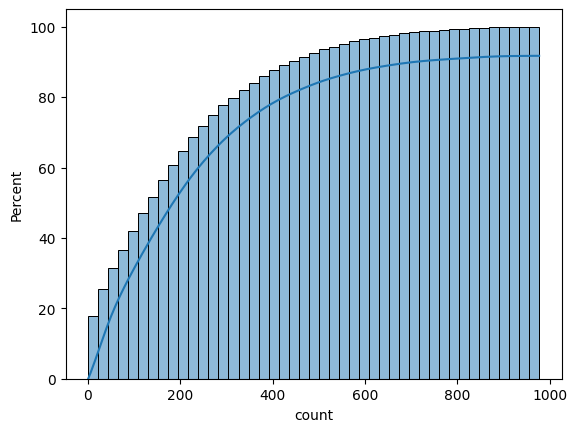

In [64]:
sns.histplot(data = df, x = 'count', kde = True, cumulative = True, stat = 'percent')
plt.show() 

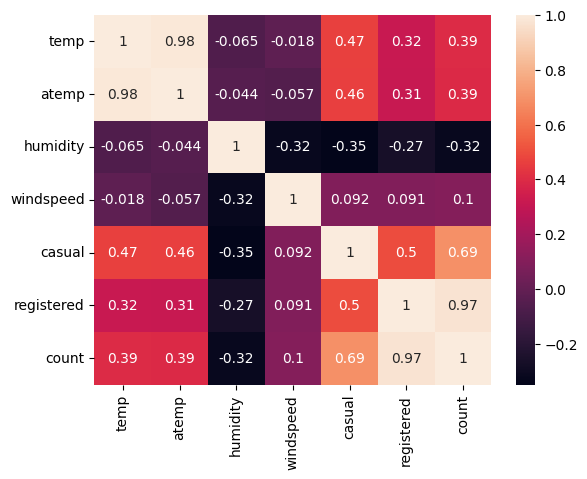

In [65]:
sns.heatmap(df.corr(), annot=True)
plt.show()

* Humidity has a negative correlation with the number of cycles rented which is -0.32
* Very High Correlation (> 0.9) exists between columns [atemp, temp] and [count, registered]
* High positively / negatively correlation (0.7 - 0.9) does not exist between any columns.
* Moderate positive correlation (0.5 - 0.7) exists between columns [casual, count], [casual, registered].
* Low Positive correlation (0.3 - 0.5) exists between columns [count, temp], [count, atemp], [casual, atemp]
* Negligible correlation exists between all other combinations of columns.

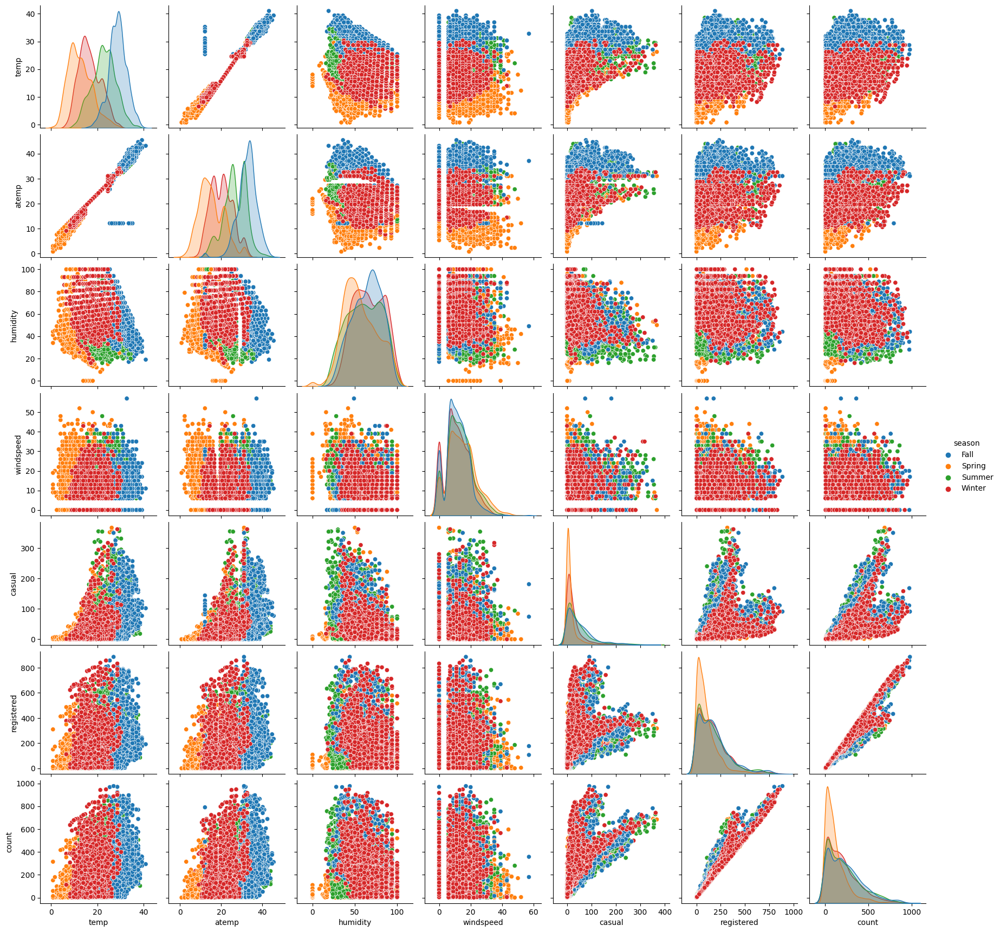

In [66]:
sns.pairplot(df, hue ='season')
plt.show()

* The pairplot displayed above showcases correlations between many type of season and different attributes, and the findings align closely with our previous observations.

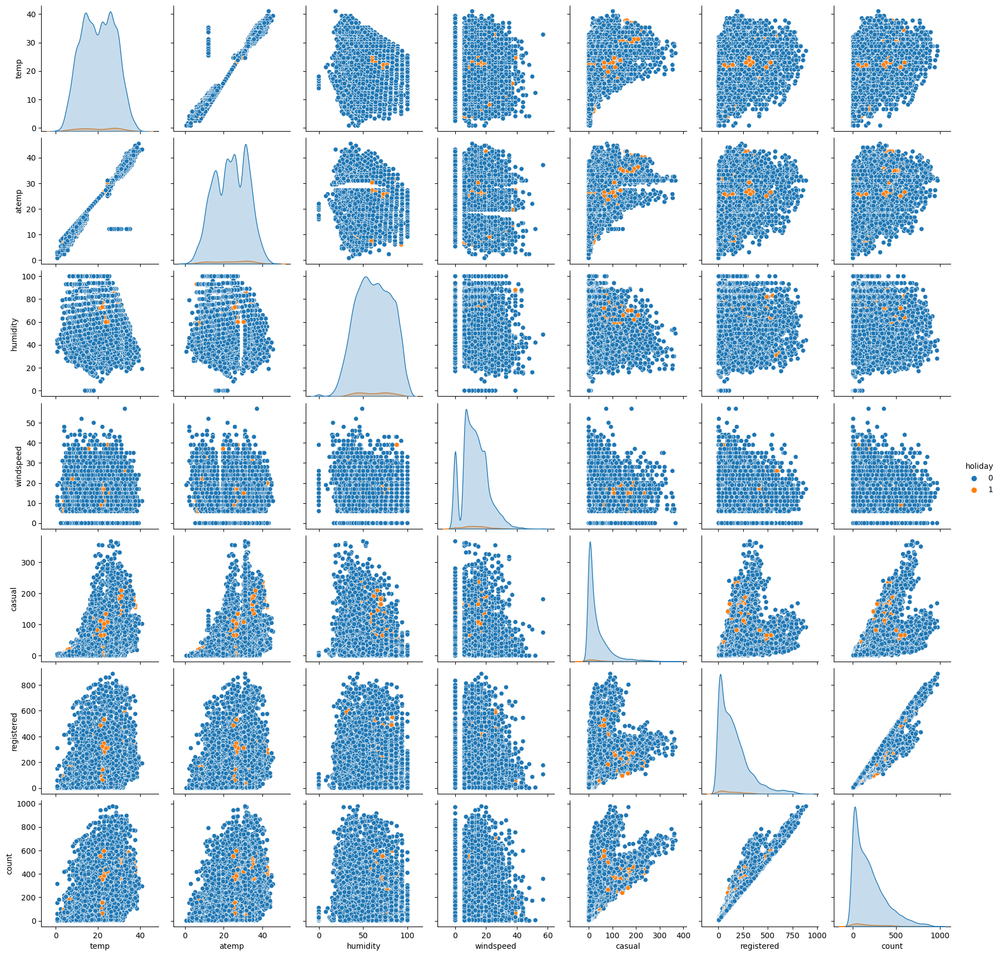

In [67]:
sns.pairplot(df, hue ='holiday')
plt.show()

* The pairplot displayed above showcases correlations between holiday and different attributes, and the findings align closely with our previous observations.

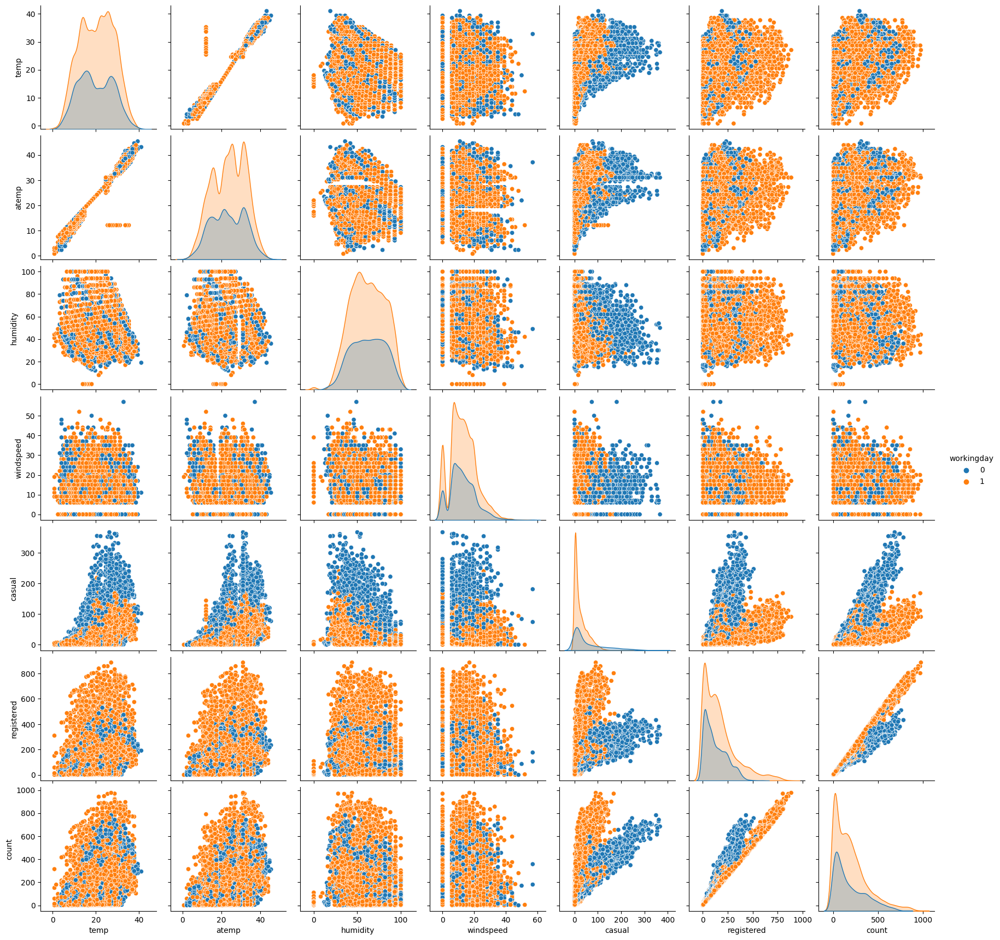

In [68]:
sns.pairplot(df, hue ='workingday')
plt.show()

* The pairplot displayed above showcases correlations between working day and different attributes, and the findings align closely with our previous observations.

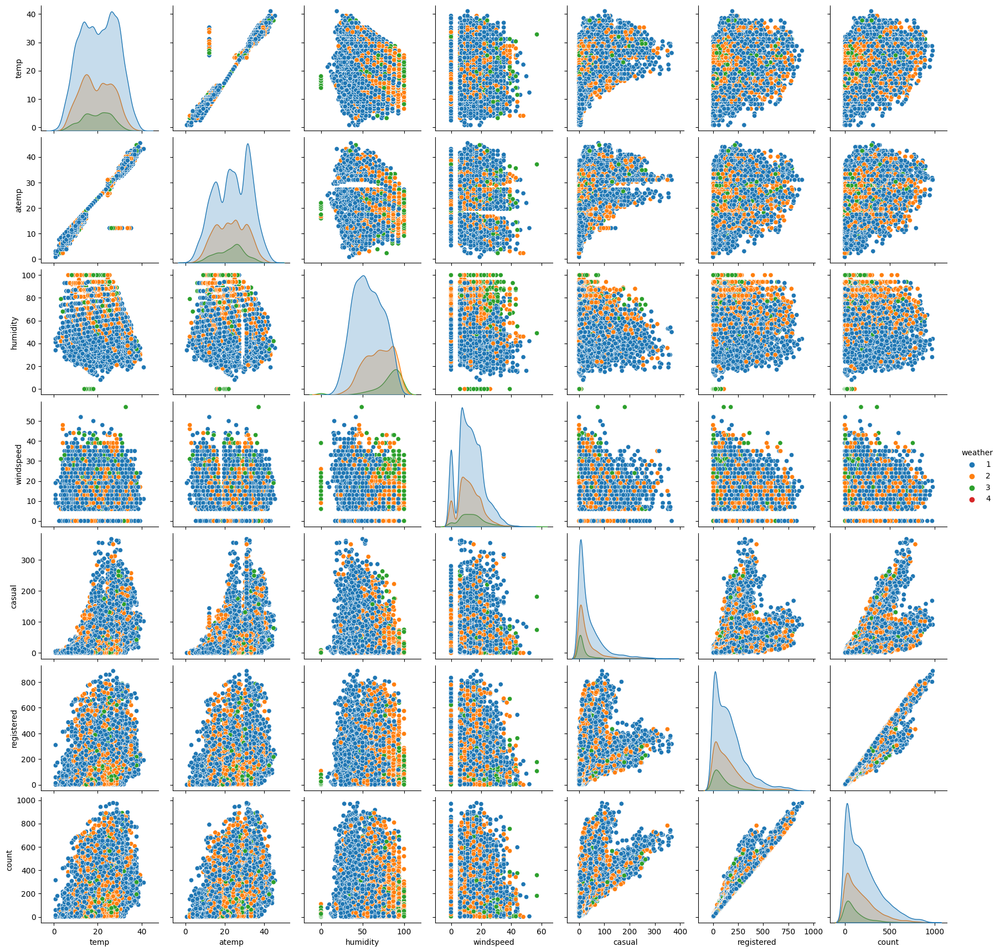

In [69]:
sns.pairplot(df, hue ='weather')
plt.show()

* The pairplot displayed above showcases correlations between different types of weather and different attributes, and the findings align closely with our previous observations.

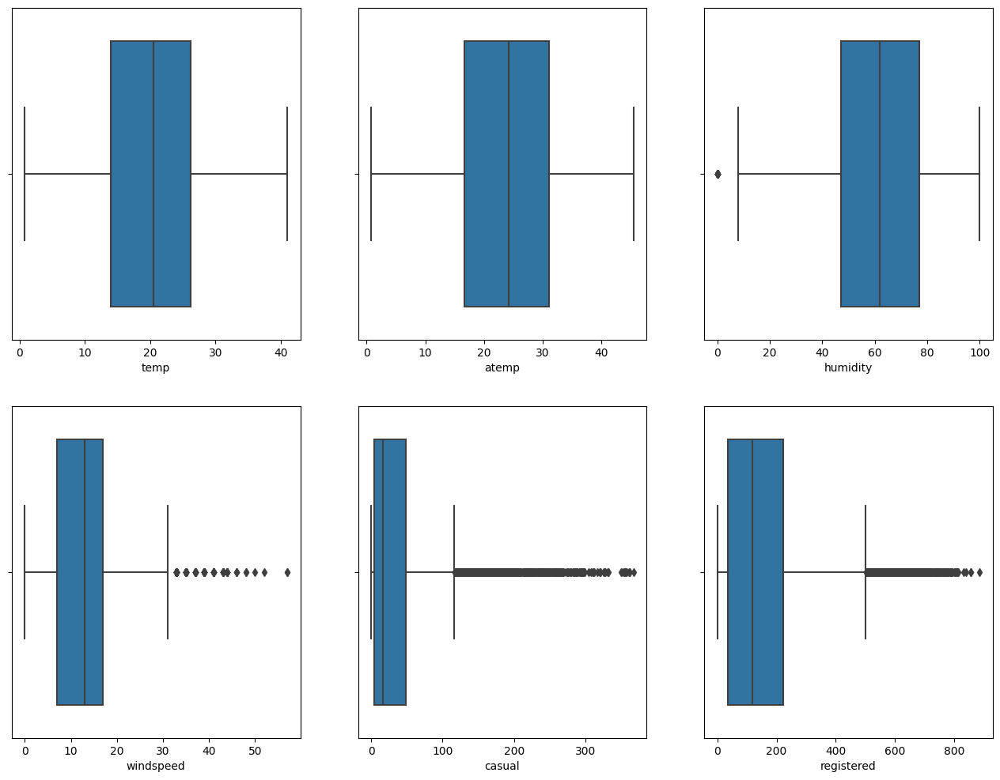

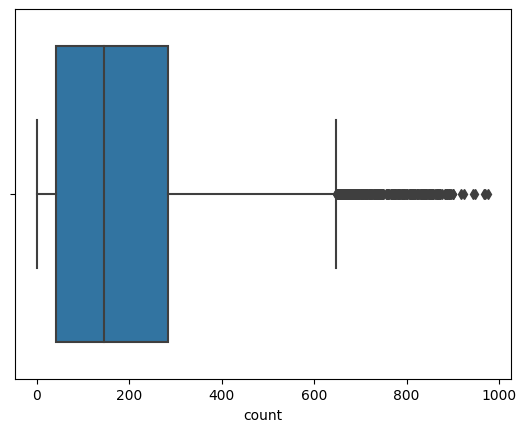

In [70]:
num_cols = ['temp', 'atemp', 'humidity', 'windspeed', 'casual', 'registered','count']
fig, axis = plt.subplots(nrows=2, ncols=3, figsize=(16, 12))

index = 0
for row in range(2):
    for col in range(3):
        sns.boxplot(x=df[num_cols[index]], ax=axis[row, col])
        index += 1
        
plt.show()
sns.boxplot(x=df[num_cols[-1]]) 
plt.show()

* There is no outlier in the temp and atemp column.
* There are few outliers present in humidity column.
* There are many outliers present in each of the columns : windspeed, casual, registered, count.

## Bivariate Analysis

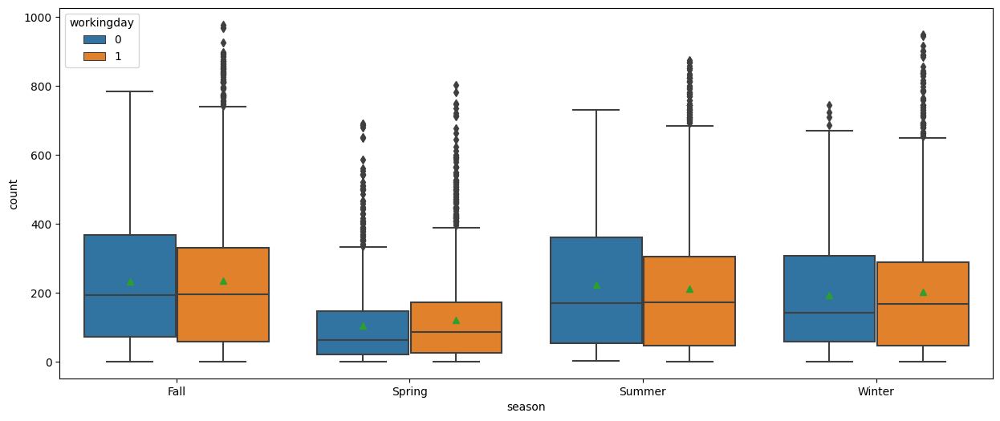

In [71]:
plt.figure(figsize = (15, 6))
sns.boxplot(data=df,x='season',y='count',hue='workingday',showmeans=True)
plt.show()

*  The spring season shows a comparatively lower count of total rental bikes per hour. This trend may be attributed to various factors, such as unpredictable weather patterns, potential rainfall, and overall transitional changes between winter and summer activities.

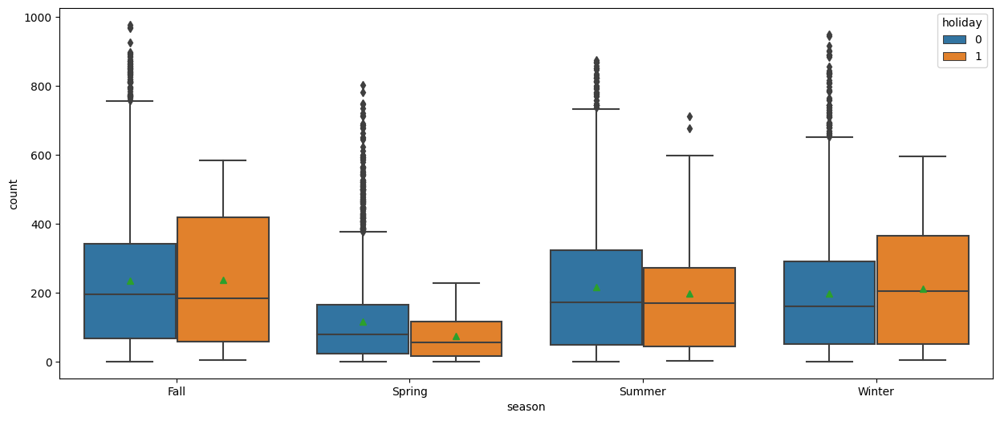

In [72]:
plt.figure(figsize = (15, 6))
sns.boxplot(data=df,x='season',y='count',hue='holiday',showmeans=True)
plt.show()

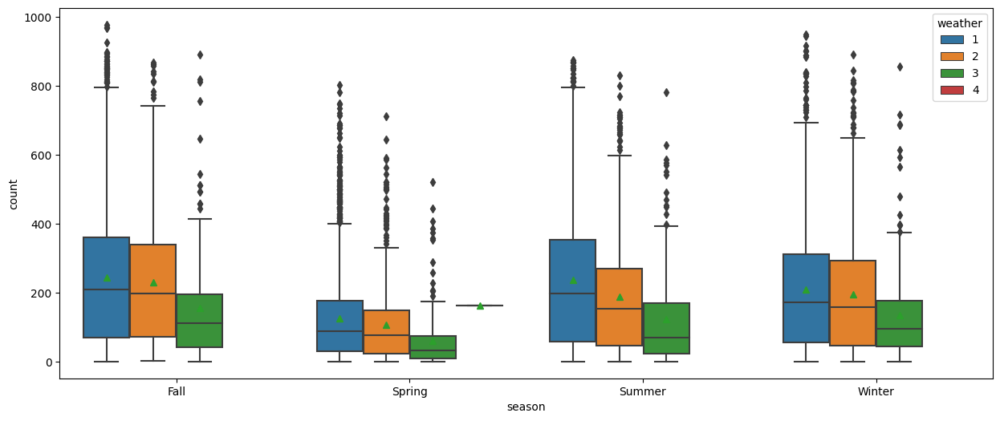

In [73]:
plt.figure(figsize = (15, 6))
sns.boxplot(data=df,x='season',y='count',hue='weather',showmeans=True)
plt.show()

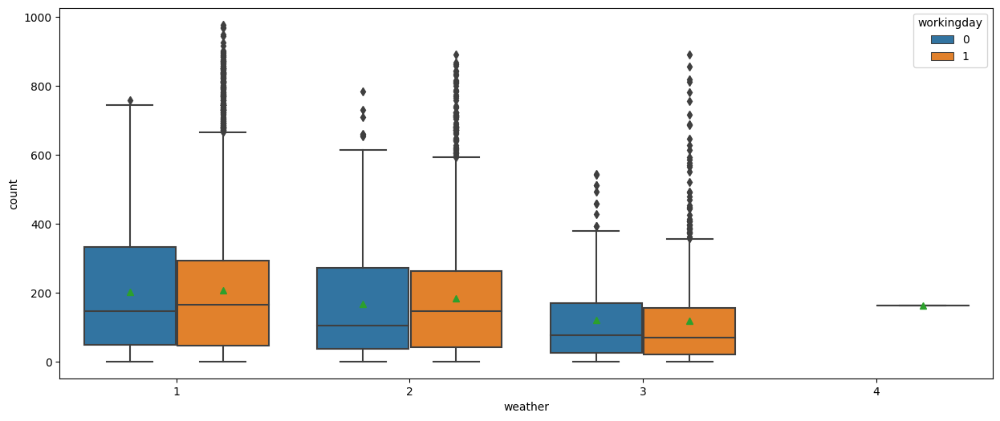

In [74]:
plt.figure(figsize = (15, 6))
sns.boxplot(data = df, x = 'weather', y = 'count', hue = 'workingday', showmeans = True)
plt.show()

* weather:
    * 1: Clear, Few clouds, partly cloudy, partly cloudy
    * 2: Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist
    * 3: Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain + Scattered clouds
    * 4: Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog
    
* The hourly count of total rental bikes is higher in the clear and cloudy weather, followed by the misty weather and rainy weather. There are very few records for extreme weather conditions.

## Is there any effect of Working Day on the number of electric cycles rented ?

In [75]:
df.groupby(by = 'workingday')['count'].describe().reset_index()

,workingday,count,mean,std,min,25%,50%,75%,max
0,0,3474.0,188.506621,173.724015,1.0,44.0,128.0,304.0,783.0
1,1,7412.0,193.011873,184.513659,1.0,41.0,151.0,277.0,977.0


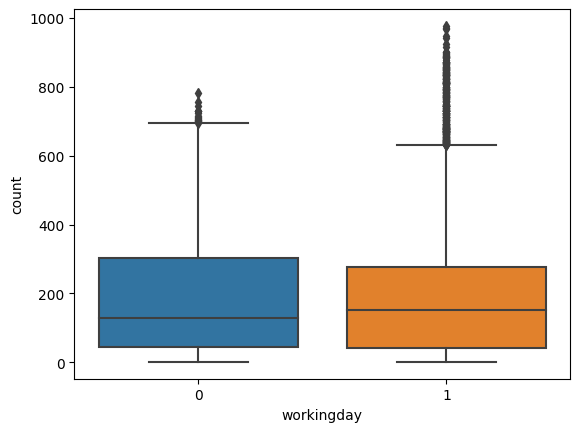

In [76]:
sns.boxplot(data = df, x = 'workingday', y = 'count')
plt.show()

###### STEP-1 : Set up Null Hypothesis

* Null Hypothesis ( H0 ) - Working Day does not have any effect on the number of electric cycles rented.

* Alternate Hypothesis ( HA ) - Working Day has some effect on the number of electric cycles rented

###### STEP-2 : Checking for basic assumpitons for the hypothesis

* Distribution check using QQ Plot
* Homogeneity of Variances using Levene's test
###### STEP-3: Define Test statistics; Distribution of T under H0.

* If the assumptions of T Test are met then we can proceed performing T Test for independent samples else we will perform the non parametric test equivalent to T Test for independent sample i.e., Mann-Whitney U rank test for two independent samples.
###### STEP-4: Compute the p-value and fix value of alpha.

* We set our alpha to be 0.05
###### STEP-5: Compare p-value and alpha.

* Based on p-value, we will accept or reject Null Hypothesis.

    * p_value < alpha : Reject the Null Hypothesis
    * p_value > alpha : Accept the Null Hypothesis
<br>

* Visual Tests to know if the samples follow normal distribution

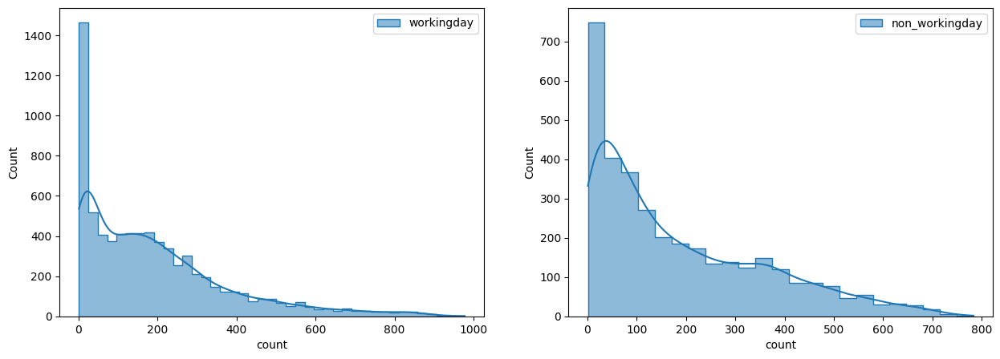

In [77]:
plt.figure(figsize = (15, 5))
plt.subplot(1, 2, 1)
sns.histplot(df.loc[df['workingday'] == 1, 'count'],element = 'step',  kde = True, label = 'workingday')
plt.legend()
plt.subplot(1, 2, 2)
sns.histplot(df.loc[df['workingday'] == 0, 'count'],element = 'step',  kde = True, label = 'non_workingday')
plt.legend()
plt.show()

* It can be inferred from the above plot that the distributions do not follow normal distribution.

### Distribution check using QQ Plot

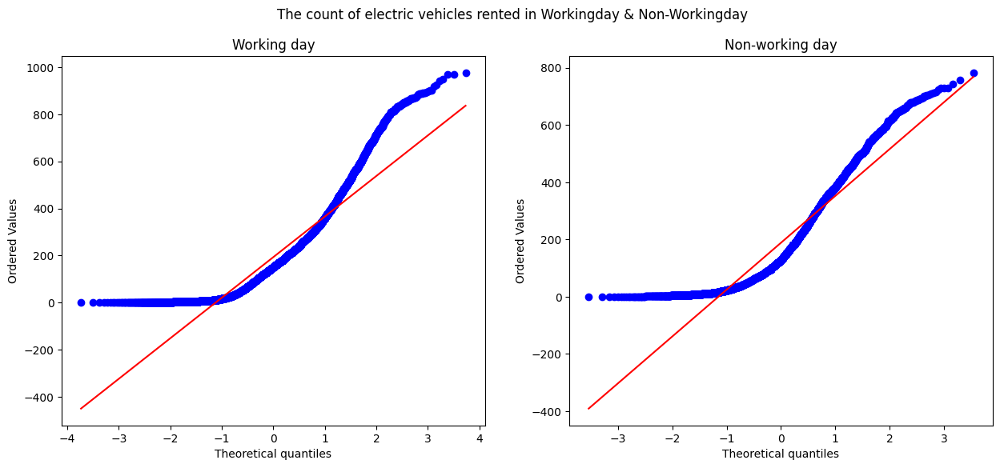

In [78]:
plt.figure(figsize = (15, 6))
plt.subplot(1, 2, 1)
plt.suptitle('The count of electric vehicles rented in Workingday & Non-Workingday')
spy.probplot(df.loc[df['workingday'] == 1, 'count'], plot = plt, dist = 'norm')
plt.title('Working day')
plt.subplot(1, 2, 2)
spy.probplot(df.loc[df['workingday'] == 0, 'count'], plot = plt, dist = 'norm')
plt.title('Non-working day')
plt.show()

* It can be inferred from the above plot that the distributions do not follow normal distribution.

* Applying Shapiro-Wilk test for normality
    * H0: The sample follows normal distribution 
    * H1: The sample does not follow normal distribution

alpha = 0.05


**Test Statistics : Shapiro-Wilk test for normality**

In [79]:
test_stat, p_value = spy.shapiro(df.loc[df['workingday'] == 1, 'count'].sample(2000))
print('p_value:', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution')    

p_value: 3.9670008429058693e-38
The sample does not follow normal distribution


In [80]:
test_stat, p_value = spy.shapiro(df.loc[df['workingday'] == 0, 'count'].sample(2000))
print('p_value:', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution')  

p_value: 7.312839931947445e-37
The sample does not follow normal distribution


#### Transforming the data using boxcox transformation and checking if the transformed data follows normal distribution.

In [81]:
wokingday_check = spy.boxcox(df.loc[df['workingday'] == 1, 'count'])[0]
test_stat, p_value = spy.shapiro(wokingday_check)
print('p-value', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution')

p-value 1.6132153862898905e-33
The sample does not follow normal distribution


In [82]:
non_wokingday_check = spy.boxcox(df.loc[df['workingday'] == 1, 'count'])[0]
test_stat, p_value = spy.shapiro(non_wokingday_check)
print('p-value', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution')

p-value 1.6132153862898905e-33
The sample does not follow normal distribution


* Despite applying the Box-Cox transformation to both the "workingday" and "non_workingday" data, normal distribution patterns have not been achieved. 
* This outcome indicates that the original data's inherent characteristics and relationships are challenging to transform into a standard Gaussian distribution using the Box-Cox method.

**Homogeneity of Variances using Lavene's test**

In [83]:
# Null Hypothesis(H0) - Homogenous Variance 
# Alternate Hypothesis(HA) - Non Homogenous Variance 
test_stat, p_value = spy.levene(df.loc[df['workingday'] == 1, 'count'].sample(2000),
                                df.loc[df['workingday'] == 0, 'count'].sample(2000))
print('p-value', p_value)
if p_value < 0.05:
    print('The samples do not have  Homogenous Variance')
else:
    print('The samples have Homogenous Variance ') 


p-value 0.5564206602522594
The samples have Homogenous Variance 


**Since the samples are not normally distributed, T-Test cannot be applied here, we can perform its non parametric equivalent test i.e., Mann-Whitney U rank test for two independent samples.**

In [84]:
test_stat, p_value = spy.mannwhitneyu(df.loc[df['workingday'] == 1, 'count'], 
                                      df.loc[df['workingday'] == 0, 'count'])
print('P-value :',p_value)
if p_value < 0.05:
    print('Mean no.of electric cycles rented is not same for working and non-working days')
else:
    print('Mean no.of electric cycles rented is same for working and non-working days')

P-value : 0.9679139953914079
Mean no.of electric cycles rented is same for working and non-working days


**Conclusion:**
* Therefore, the mean hourly count of the total rental bikes is statistically same for both working and non- working days .

### Is there any effect of holidays on the number of electric cycles rented ?

In [85]:
df.groupby(by = 'holiday')['count'].describe().reset_index()

,holiday,count,mean,std,min,25%,50%,75%,max
0,0,10575.0,191.741655,181.513131,1.0,43.0,145.0,283.0,977.0
1,1,311.0,185.877814,168.300531,1.0,38.5,133.0,308.0,712.0


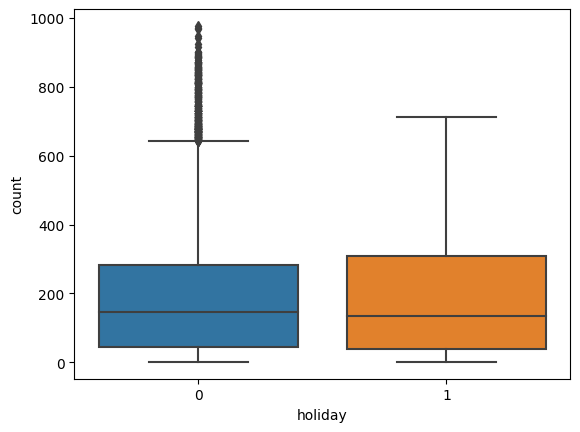

In [86]:
sns.boxplot(data = df, x = 'holiday', y = 'count')
plt.show()

###### STEP-1 : Set up Null Hypothesis

* Null Hypothesis ( H0 ) -  Holidays have no effect on the number of electric vehicles rented

* Alternate Hypothesis ( HA ) - Holidays has some effect on the number of electric vehicles rented

###### STEP-2 : Checking for basic assumpitons for the hypothesis

* Distribution check using QQ Plot
* Homogeneity of Variances using Levene's test

###### STEP-3: Define Test statistics; Distribution of T under H0.

* If the assumptions of T Test are met then we can proceed performing T Test for independent samples else we will perform the non parametric test equivalent to T Test for independent sample i.e., Mann-Whitney U rank test for two independent samples.

###### STEP-4: Compute the p-value and fix value of alpha.

* We set our alpha to be 0.05

###### STEP-5: Compare p-value and alpha.

* Based on p-value, we will accept or reject Null Hypothesis.

    * p_value < alpha : Reject the Null Hypothesis
    * p_value > alpha : Accept the Null Hypothesis

<br>
* Visual Tests to know if the samples follow normal distribution

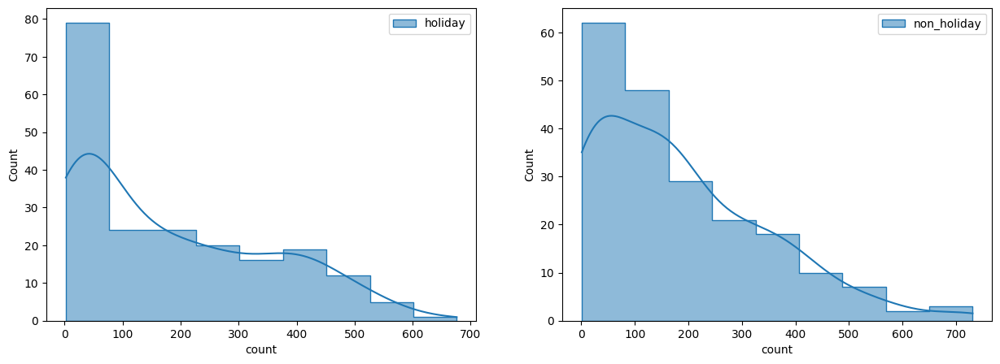

In [87]:
plt.figure(figsize = (15, 5))
plt.subplot(1, 2, 1)
sns.histplot(df.loc[df['holiday'] == 1, 'count'].sample(200), 
             element = 'step', kde = True, label = 'holiday')
plt.legend()
plt.subplot(1, 2, 2)
sns.histplot(df.loc[df['holiday'] == 0, 'count'].sample(200), 
             element = 'step', kde = True, label = 'non_holiday')
plt.legend()
plt.show()

* It can be inferred from the above plot that the distributions do not follow normal distribution.

### Distribution check using QQ Plot

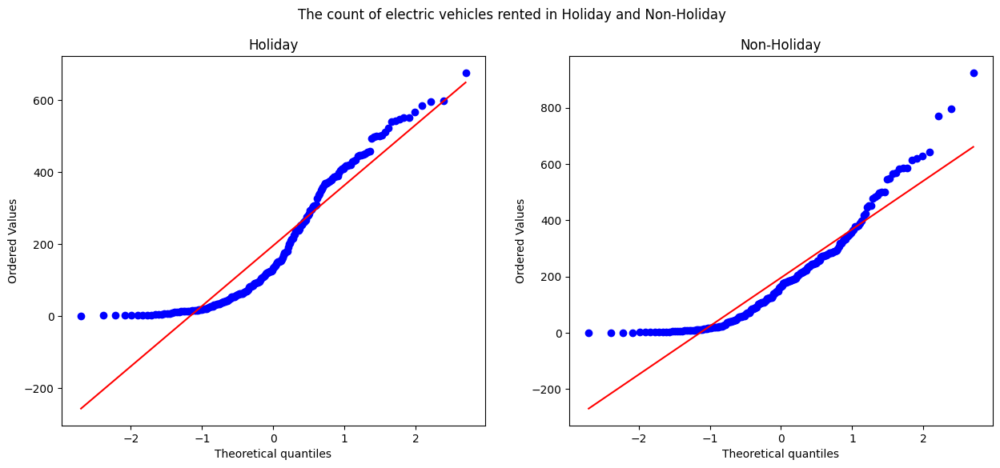

In [88]:
plt.figure(figsize = (15, 6))
plt.subplot(1, 2, 1)
plt.suptitle('The count of electric vehicles rented in Holiday and Non-Holiday')
spy.probplot(df.loc[df['holiday'] == 1, 'count'].sample(200), plot = plt, dist = 'norm')
plt.title('Holiday')
plt.subplot(1, 2, 2)
spy.probplot(df.loc[df['holiday'] == 0, 'count'].sample(200), plot = plt, dist = 'norm')
plt.title('Non-Holiday')
plt.show()

* It can be inferred from the above plot that the distributions do not follow normal distribution.

* Applying Shapiro-Wilk test for normality
    * H0: The sample follows normal distribution 
    * H1: The sample does not follow normal distribution

alpha = 0.05

**Test Statistics : Shapiro-Wilk test for normality**

In [89]:
test_stat, p_value = spy.shapiro(df.loc[df['holiday'] == 1, 'count'].sample(200))
print('p-value', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution')  

p-value 9.72158725048855e-12
The sample does not follow normal distribution


In [90]:
test_stat, p_value = spy.shapiro(df.loc[df['holiday'] == 0, 'count'].sample(200))
print('p-value', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution')  

p-value 4.501425274194837e-12
The sample does not follow normal distribution


#### Transforming the data using boxcox transformation and checking if the transformed data follows normal distribution.

In [91]:
holiday_check= spy.boxcox(df.loc[df['holiday'] == 1, 'count'])[0]
test_stat, p_value = spy.shapiro(holiday_check)
print('p-value', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution') 

p-value 2.1349286782879062e-07
The sample does not follow normal distribution


In [92]:
non_holiday_check = spy.boxcox(df.loc[df['holiday'] == 0, 'count'].sample(5000))[0]
test_stat, p_value = spy.shapiro(non_holiday_check)
print('p-value', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution')

p-value 5.718216197749944e-27
The sample does not follow normal distribution


* Despite applying the Box-Cox transformation to both the "Holiday" and "non_holiday" data, normal distribution patterns have not been achieved. 
* This outcome indicates that the original data's inherent characteristics and relationships are challenging to transform into a standard Gaussian distribution using the Box-Cox method.

#### Homogeneity of Variances using Levene's test

In [93]:
# Null Hypothesis(H0) - Homogenous Variance 
# Alternate Hypothesis(HA) - Non Homogenous Variance 

test_stat, p_value = spy.levene(df.loc[df['holiday'] == 0, 'count'].sample(200),
                                df.loc[df['holiday'] == 1, 'count'].sample(200))
print('p-value', p_value)
if p_value < 0.05:
    print('The samples do not have  Homogenous Variance')
else:
    print('The samples have Homogenous Variance ') 

p-value 0.7261188633797718
The samples have Homogenous Variance 


**Since the samples are not normally distributed, T-Test cannot be applied here, we can perform its non parametric equivalent test i.e., Mann-Whitney U rank test for two independent samples.**

In [94]:
test_stat, p_value = spy.mannwhitneyu(df.loc[df['holiday'] == 0, 'count'].sample(200),
                                      df.loc[df['holiday'] == 1, 'count'].sample(200))
print('P-value :',p_value)
if p_value < 0.05:
    print('No.of electric cycles rented is not similar for holidays and non-holidays days')
else:
    print('No.of electric cycles rented is similar for holidays and non-holidays')

P-value : 0.3241039799204153
No.of electric cycles rented is similar for holidays and non-holidays


**Conclusion:**
* Therefore, the number of electric cycles rented is statistically similar for both holidays and non - holidays.

### Is weather dependent on the season ?

In [95]:
df[['weather', 'season']].describe()

,weather,season
count,10886,10886
unique,4,4
top,1,Winter
freq,7192,2734


* It is clear from the above statistical description that both 'weather' and 'season' features are categorical in nature.

**STEP-1 : Set up Null Hypothesis**
* Null Hypothesis ( H0 ) - weather is independent of season
* Alternate Hypothesis ( HA ) - weather is dependent of seasons.

**STEP-2: Define Test statistics**
* Since we have two categorical features, the Chi- square test is applicable here. Under H0, the test statistic should follow Chi-Square Distribution.

**STEP-3: Checking for basic assumptons for the hypothesis (Non-Parametric Test)**
* The data in the cells should be frequencies, or counts of cases.
* The levels (or categories) of the variables are mutually exclusive. That is, a particular subject fits into one and only one level of each of the variables.
* There are 2 variables, and both are measured as categories.
* The value of the cell expecteds should be 5 or more in at least 80% of the cells, and no cell should have an expected of less than one (3).

**STEP-4: Compute the p-value and fix value of alpha**
* we will be computing the chi square-test p-value using the chi2_contingency function using scipy.stats. We set our alpha to be 0.05

**STEP-5: Compare p-value and alpha**
* Based on p-value, we will accept or reject Null Hypothesis.
    * p_value > alpha : Accept Null Hypothesis
    * p_value < alpha : Reject Null Hypothesis
    
    <br>
    
* The Chi-square statistic is a non-parametric (distribution free) tool designed to analyze group differences when the dependent variable is measured at a nominal level. Like all non-parametric statistics, the Chi-square is robust with respect to the distribution of the data. Specifically, it does not require equality of variances among the study groups or homoscedasticity in the data.

In [96]:
# First, finding the contingency table such that each value is the total number of total bikes rented 
  # for a particular season and weather 
swc_crosstab = pd.crosstab(index = df['season'], 
                          columns = df['weather'], 
                          values = df['count'], 
                          aggfunc = np.sum).replace(np.nan, 0)
swc_crosstab

weather,1,2,3,4
season,,,,
Fall,470116,139386,31160,0
Spring,223009,76406,12919,164
Summer,426350,134177,27755,0
Winter,356588,157191,30255,0


* Given that the contingency table contains a column with a majority of cells having a count of rented electric vehicles less than 5, it is advisable to exclude the data corresponding to weather condition 4 before proceeding with further analysis.

In [97]:
crosstab_only_3weather = pd.crosstab(index = df['season'], 
                          columns = df.loc[df['weather'] != 4, 'weather'], 
                          values = df['count'], 
                          aggfunc = np.sum).to_numpy()[:, :3]
crosstab_only_3weather

array([[470116, 139386,  31160],
       [223009,  76406,  12919],
       [426350, 134177,  27755],
       [356588, 157191,  30255]], dtype=int64)

In [98]:
chi_test_stat, p_value, dof, expected = spy.chi2_contingency(observed = crosstab_only_3weather)
print('Test Statistic =', chi_test_stat)
print('p value =', p_value)
print('-' * 65)
print("Expected : '\n'", expected)

Test Statistic = 10838.372332480214
p value = 0.0
-----------------------------------------------------------------
Expected : '
' [[453484.88557396 155812.72247031  31364.39195574]
 [221081.86259035  75961.44434981  15290.69305984]
 [416408.3330293  143073.60199337  28800.06497733]
 [385087.91880639 132312.23118651  26633.8500071 ]]


In [99]:
#Comparing p value with significance level
alpha = 0.05
if p_value < alpha:
    print('Reject Null Hypothesis')
else:
    print('Failed to reject Null Hypothesis')

Reject Null Hypothesis


**Conclusion:**
* Therefore, there is statistically significant dependency of weather and season based on the number of number of bikes rented.

### Is the number of cycles rented is similar or different in different weather ?

In [100]:
df.groupby(by = 'weather')['count'].describe().reset_index()

,weather,count,mean,std,min,25%,50%,75%,max
0,1,7192.0,205.236791,187.959566,1.0,48.0,161.0,305.0,977.0
1,2,2834.0,178.955540,168.366413,1.0,41.0,134.0,264.0,890.0
2,3,859.0,118.846333,138.581297,1.0,23.0,71.0,161.0,891.0
3,4,1.0,164.000000,NaN,164.0,164.0,164.0,164.0,164.0


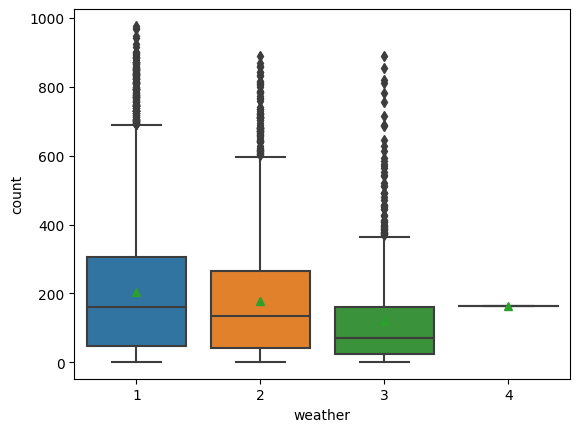

In [101]:
sns.boxplot(data = df, x = 'weather', y = 'count', showmeans = True)
plt.show()

In [102]:
df_weather1 = df.loc[df['weather'] == 1]
df_weather2 = df.loc[df['weather'] == 2]
df_weather3 = df.loc[df['weather'] == 3]
df_weather4 = df.loc[df['weather'] == 4]
len(df_weather1), len(df_weather2), len(df_weather3), len(df_weather4)

(7192, 2834, 859, 1)

**STEP-1 : Set up Null Hypothesis**

* Null Hypothesis ( H0 ) - Mean of cycle rented per hour is same for weather 1, 2 and 3.
(We wont be considering weather 4 as there in only 1 data point for weather 4 and we cannot perform a ANOVA test with a single data point for a group)

* Alternate Hypothesis ( HA ) -Mean of cycle rented per hour is not same for season 1,2,3 and 4 are different.

**STEP-2 : Checking for basic assumpitons for the hypothesis**
* Normality check using QQ Plot. If the distribution is not normal, use BOX-COX transform to transform it to normal distribution.
* Homogeneity of Variances using Levene's test
* Each observations are independent.

**STEP-3: Define Test statistics**
* The test statistic for a One-Way ANOVA is denoted as F. For an independent variable with k groups, the F statistic evaluates whether the group means are significantly different.

F=MSB / MSW

Under H0, the test statistic should follow F-Distribution.

**STEP-4: Decide the kind of test**

* We will be performing right tailed f-test

**STEP-5: Compute the p-value and fix value of alpha**

* we will be computing the anova-test p-value using the f_oneway function using scipy.stats. We set our alpha to be 0.05

**STEP-6: Compare p-value and alpha**
* Based on p-value, we will accept or reject Null Hypothesis.
    * p_value > alpha : Accept Null Hypothesis
    * p_value < alpha : Reject Null Hypothesis
* Visual Tests to know if the samples follow normal distribution

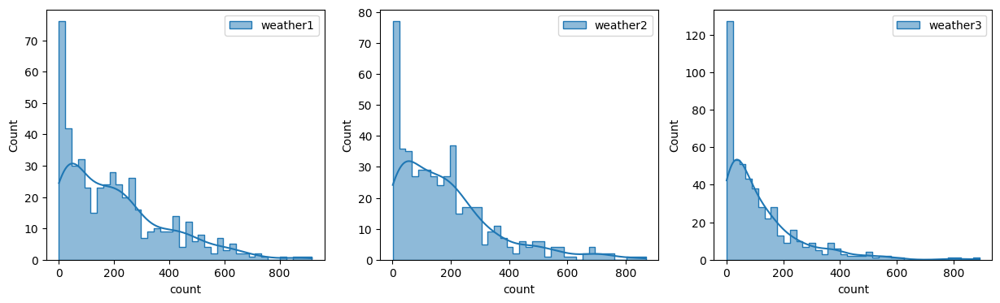

In [103]:
plt.figure(figsize = (15, 4))
plt.subplot(1, 3, 1)
sns.histplot(df_weather1.loc[:, 'count'].sample(500), bins = 40, 
             element = 'step', kde = True, label = 'weather1')
plt.legend()
plt.subplot(1, 3, 2)
sns.histplot(df_weather2.loc[:, 'count'].sample(500), bins = 40,
             element = 'step',  kde = True, label = 'weather2')
plt.legend()
plt.subplot(1, 3, 3)
sns.histplot(df_weather3.loc[:, 'count'].sample(500), bins = 40,
             element = 'step', kde = True, label = 'weather3')
plt.legend()
plt.show()

* It can be inferred from the above plot that the distributions do not follow normal distribution.

### Distribution check using QQ Plot

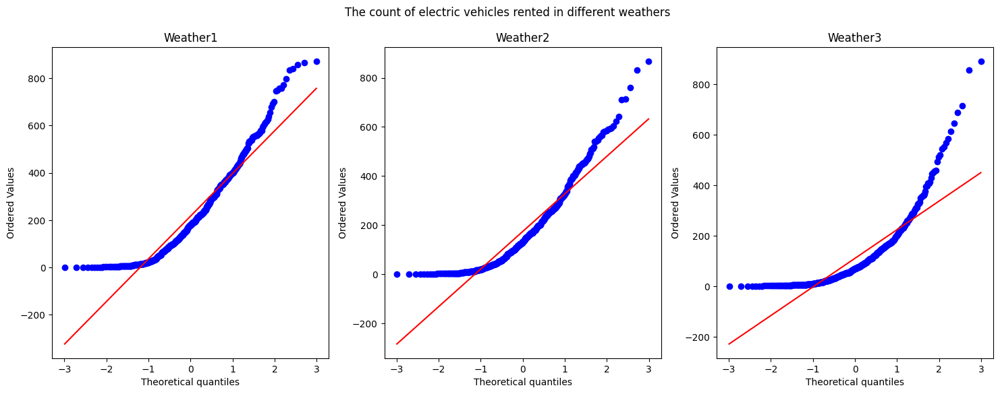

In [104]:
plt.figure(figsize = (18, 6))
plt.subplot(1, 3, 1)
plt.suptitle('The count of electric vehicles rented in different weathers')
spy.probplot(df_weather1.loc[:, 'count'].sample(500), plot = plt, dist = 'norm')
plt.title('Weather1')
plt.subplot(1, 3, 2)
spy.probplot(df_weather2.loc[:, 'count'].sample(500), plot = plt, dist = 'norm')
plt.title('Weather2')
plt.subplot(1, 3, 3)
spy.probplot(df_weather3.loc[:, 'count'].sample(500), plot = plt, dist = 'norm')
plt.title('Weather3')
plt.show()

* It can be inferred from the above plot that the distributions do not follow normal distribution.
* It can be seen from the above plots that the samples do not come from normal distribution.
* Applying Shapiro-Wilk test for normality
    * H0 : The sample follows normal distribution 
    * Ha: The sample does not follow normal distribution

alpha = 0.05

**Test Statistics : Shapiro-Wilk test for normality**

In [105]:
test_stat, p_value = spy.shapiro(df_weather1.loc[:, 'count'].sample(500))
print('p-value', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution')    

p-value 7.59080023861619e-17
The sample does not follow normal distribution


In [106]:
test_stat, p_value = spy.shapiro(df_weather2.loc[:, 'count'].sample(500))
print('p-value', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution')

p-value 8.120344831727842e-21
The sample does not follow normal distribution


In [107]:
test_stat, p_value = spy.shapiro(df_weather3.loc[:, 'count'].sample(500))
print('p-value', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution') 

p-value 2.0844490781010694e-26
The sample does not follow normal distribution


#### Transforming the data using boxcox transformation and checking if the transformed data follows normal distribution.

In [108]:
transformed_weather1 = spy.boxcox(df_weather1.loc[:, 'count'].sample(5000))[0]
test_stat, p_value = spy.shapiro(transformed_weather1)
print('p-value', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution') 

p-value 2.2572351541755335e-27
The sample does not follow normal distribution


In [109]:
transformed_weather2 = spy.boxcox(df_weather2.loc[:, 'count'])[0]
test_stat, p_value = spy.shapiro(transformed_weather2)
print('p-value', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution') 

p-value 1.9216098393369846e-19
The sample does not follow normal distribution


In [110]:
transformed_weather3 = spy.boxcox(df_weather3.loc[:, 'count'])[0]
test_stat, p_value = spy.shapiro(transformed_weather3)
print('p-value', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution') 

p-value 1.4133181593933841e-06
The sample does not follow normal distribution


* Even after applying the boxcox transformation on each of the weather data, the samples do not follow normal distribution.

#### Homogeneity of Variances using Levene's test

In [111]:
# Null Hypothesis(H0) - Homogenous Variance 
# Alternate Hypothesis(HA) - Non Homogenous Variance 

test_stat, p_value = spy.levene(df_weather1.loc[:, 'count'].sample(500),
                                df_weather2.loc[:, 'count'].sample(500),
                                df_weather3.loc[:, 'count'].sample(500))
print('p-value', p_value)
if p_value < 0.05:
    print('The samples do not have  Homogenous Variance')
else:
    print('The samples have Homogenous Variance ') 

p-value 2.1102063177604262e-13
The samples do not have  Homogenous Variance


#### Since the samples are not normally distributed and do not have the same variance, f_oneway test cannot be performed here, we can perform its non parametric equivalent test i.e., Kruskal-Wallis H-test for independent samples.

In [112]:
alpha = 0.05
test_stat, p_value = spy.kruskal(df_weather1.loc[:, 'count'],
                                df_weather2.loc[:, 'count'],
                                df_weather3.loc[:, 'count']) 
print('Test Statistic =', test_stat)
print('p value =', p_value)

Test Statistic = 204.95566833068537
p value = 3.122066178659941e-45


In [113]:
if p_value < alpha:
    print('Reject Null Hypothesis')
else:
    print('Failed to reject Null Hypothesis')

Reject Null Hypothesis


**Conclusion:**
* Therefore, the average number of rental bikes is statistically different for different weathers.

### Is the number of cycles rented is similar or different in different season ?

In [114]:
df.groupby(by = 'season')['count'].describe()

,count,mean,std,min,25%,50%,75%,max
season,,,,,,,,
Fall,2733.0,234.417124,197.151001,1.0,68.0,195.0,347.0,977.0
Spring,2686.0,116.343261,125.273974,1.0,24.0,78.0,164.0,801.0
Summer,2733.0,215.251372,192.007843,1.0,49.0,172.0,321.0,873.0
Winter,2734.0,198.988296,177.622409,1.0,51.0,161.0,294.0,948.0


In [115]:
sspring = df.loc[df['season'] == 'Spring', 'count']
ssummer = df.loc[df['season'] == 'Summer', 'count']
sfall = df.loc[df['season'] == 'Fall', 'count']
swinter = df.loc[df['season'] == 'Winter', 'count']
len(sspring), len(ssummer), len(sfall), len(swinter)

(2686, 2733, 2733, 2734)

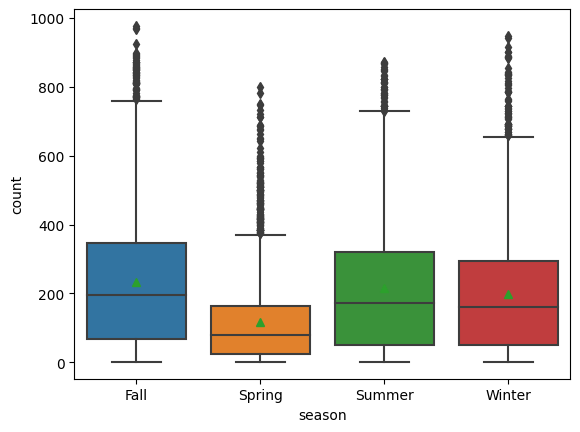

In [116]:
sns.boxplot(data = df, x = 'season', y = 'count', showmeans = True)
plt.show()

**STEP-1 : Set up Null Hypothesis**

* Null Hypothesis ( H0 ) - Mean of cycle rented per hour is same for season 1,2,3 and 4.
* Alternate Hypothesis ( HA ) -Mean of cycle rented per hour is different for season 1,2,3 and 4.

**STEP-2 : Checking for basic assumpitons for the hypothesis**

* Normality check using QQ Plot. If the distribution is not normal, use BOX-COX transform to transform it to normal distribution.

* Homogeneity of Variances using Levene's test

* Each observations are independent.

**STEP-3: Define Test statistics**

* The test statistic for a One-Way ANOVA is denoted as F. For an independent variable with k groups, the F statistic evaluates whether the group means are significantly different.

F=MSB/MSW

Under H0, the test statistic should follow F-Distribution.

**STEP-4: Decide the kind of test**

* We will be performing right tailed f-test

**STEP-5: Compute the p-value and fix value of alpha**

* we will be computing the anova-test p-value using the f_oneway function using scipy.stats. We set our alpha to be 0.05

**STEP-6: Compare p-value and alpha**

* Based on p-value, we will accept or reject Null Hypothesis. 
    * p-value > alpha : Accept Null Hypothesis 
    * p-value < alpha : Reject Null Hypothesis

* The one-way ANOVA compares the means between the groups you are interested in and determines whether any of those means are statistically significantly different from each other.

* Specifically, it tests the null hypothesis (H0):

    * **µ1 = µ2 = µ3 = ..... = µk**

where, µ = group mean and k = number of groups.

* The one-way ANOVA returns a statistically significant result, we accept the alternative hypothesis (HA), which is that there are at least two group means that are statistically significantly different from each other.

* Visual Tests to know if the samples follow normal distribution

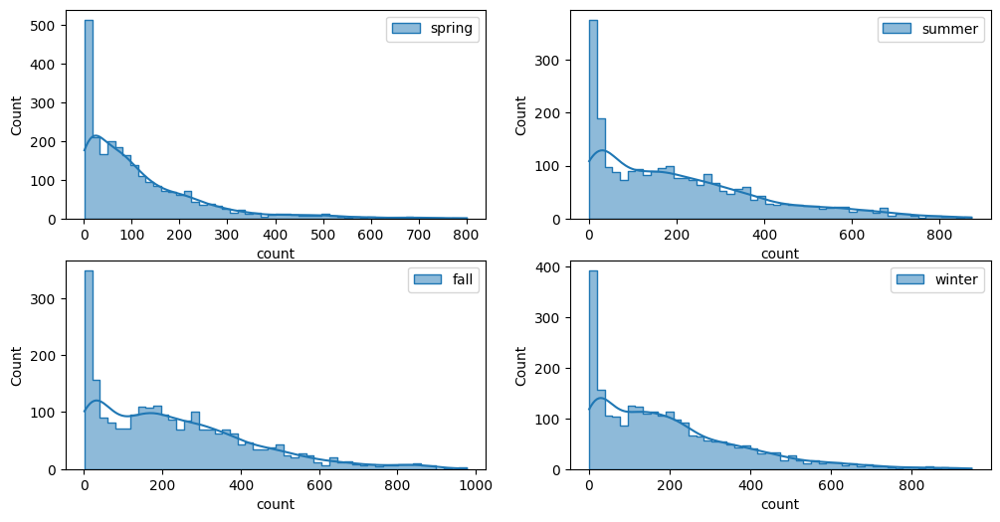

In [117]:
plt.figure(figsize = (12, 6))
plt.subplot(2, 2, 1)
sns.histplot(sspring.sample(2500), bins = 50, 
             element = 'step', kde = True, label = 'spring')
plt.legend()
plt.subplot(2, 2, 2)
sns.histplot(ssummer.sample(2500), bins = 50,
             element = 'step', kde = True, label = 'summer')
plt.legend()
plt.subplot(2, 2, 3)
sns.histplot(sfall.sample(2500), bins = 50,
             element = 'step', kde = True, label = 'fall')
plt.legend()
plt.subplot(2, 2, 4)
sns.histplot(swinter.sample(2500), bins = 50,
             element = 'step', kde = True, label = 'winter')
plt.legend()
plt.show()

* It can be inferred from the above plot that the distributions do not follow normal distribution.

### Distribution check using QQ Plot*

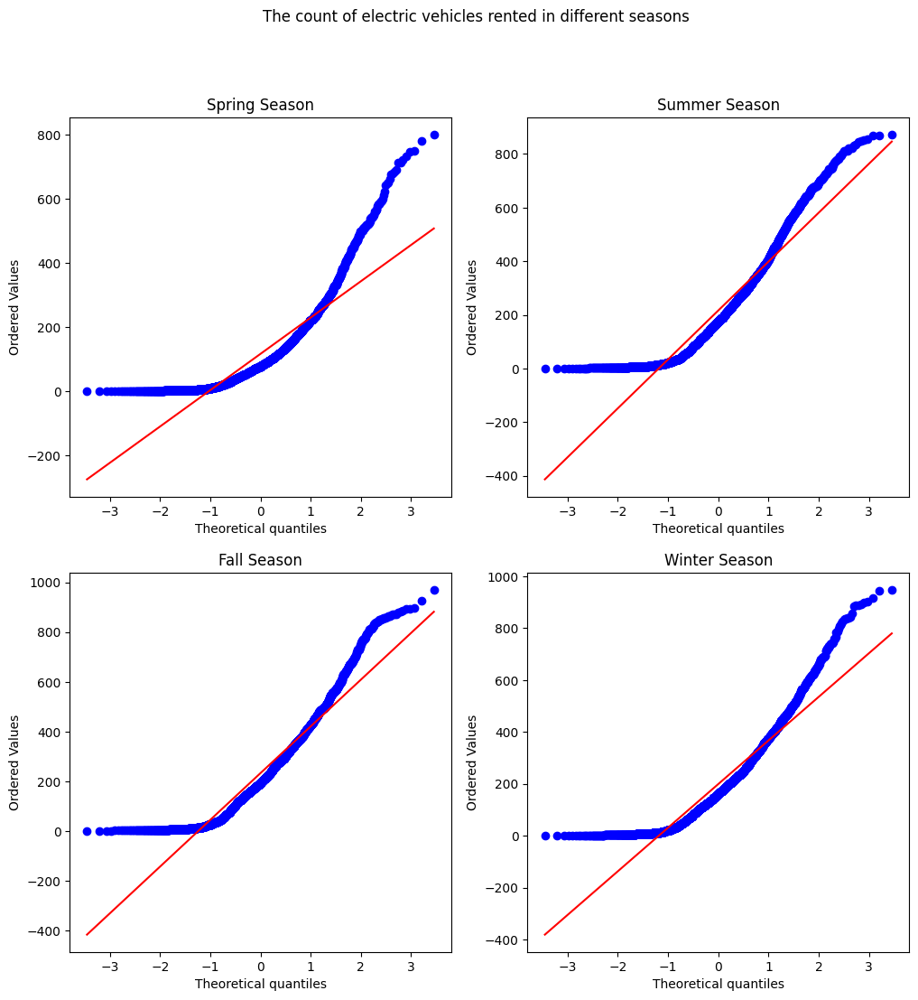

In [118]:
plt.figure(figsize = (12, 12))
plt.subplot(2, 2, 1)
plt.suptitle('The count of electric vehicles rented in different seasons')
spy.probplot(sspring.sample(2500), plot = plt, dist = 'norm')
plt.title('Spring Season')

plt.subplot(2, 2, 2)
spy.probplot(ssummer.sample(2500), plot = plt, dist = 'norm')
plt.title('Summer Season')

plt.subplot(2, 2, 3)
spy.probplot(sfall.sample(2500), plot = plt, dist = 'norm')
plt.title('Fall Season')

plt.subplot(2, 2, 4)
spy.probplot(swinter.sample(2500), plot = plt, dist = 'norm')
plt.title('Winter Season')
plt.show()

* It can be inferred from the above plots that the distributions do not follow normal distribution.
* It can be seen from the above plots that the samples do not come from normal distribution.
* Applying Shapiro-Wilk test for normality
    * H0 : The sample follows normal distribution 
    * Ha : The sample does not follow normal distribution

alpha = 0.05

**Test Statistics : Shapiro-Wilk test for normality**

In [119]:
test_stat, p_value = spy.shapiro(sspring.sample(2500))
print('p-value', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution')    

p-value 0.0
The sample does not follow normal distribution


In [120]:
test_stat, p_value = spy.shapiro(ssummer.sample(2500))
print('p-value', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution')  

p-value 2.3789503233055896e-37
The sample does not follow normal distribution


In [121]:
test_stat, p_value = spy.shapiro(sfall.sample(2500))
print('p-value', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution') 

p-value 1.3400086021326757e-35
The sample does not follow normal distribution


In [122]:
test_stat, p_value = spy.shapiro(swinter.sample(2500))
print('p-value', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution') 

p-value 7.634217421183645e-38
The sample does not follow normal distribution


####  Transforming the data using boxcox transformation and checking if the transformed data follows normal distribution.

In [123]:
df_sspring_checking = spy.boxcox(sspring.sample(2500))[0]
test_stat, p_value = spy.shapiro(df_sspring_checking)
print('p-value', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution') 

p-value 7.697360292103231e-17
The sample does not follow normal distribution


In [124]:
df_ssummer_checking = spy.boxcox(ssummer.sample(2500))[0]
test_stat, p_value = spy.shapiro(df_ssummer_checking)
print('p-value', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution') 

p-value 3.498188007958668e-21
The sample does not follow normal distribution


In [125]:
df_sfall_checking = spy.boxcox(sfall.sample(2500))[0]
test_stat, p_value = spy.shapiro(df_sfall_checking)
print('p-value', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution') 

p-value 3.5001174228933196e-21
The sample does not follow normal distribution


In [126]:
df_swinter_checking = spy.boxcox(swinter.sample(2500))[0]
test_stat, p_value = spy.shapiro(df_swinter_checking)
print('p-value', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution') 

p-value 1.0143834758950833e-19
The sample does not follow normal distribution


* Even after applying the boxcox transformation on each of the season data, the samples do not follow normal distribution.

### Homogeneity of Variances using Levene's test

In [127]:
# Null Hypothesis(H0) - Homogenous Variance 
# Alternate Hypothesis(HA) - Non Homogenous Variance 
test_stat, p_value = spy.levene(sspring.sample(2500),
                                ssummer.sample(2500),
                                sfall.sample(2500),
                                swinter.sample(2500))
print('p-value', p_value)
if p_value < 0.05:
    print('The samples do not have  Homogenous Variance')
else:
    print('The samples have Homogenous Variance ') 

p-value 2.16306379711132e-111
The samples do not have  Homogenous Variance


#### Since the samples are not normally distributed and do not have the same variance, f_oneway test cannot be performed here, we can perform its non parametric equivalent test i.e., Kruskal-Wallis H-test for independent samples.

In [128]:
alpha = 0.05
test_stat, p_value = spy.kruskal(sspring, ssummer, sfall,swinter)  
print('Test Statistic =', test_stat)
print('p value =', p_value)

Test Statistic = 699.6668548181988
p value = 2.479008372608633e-151


In [129]:
if p_value < alpha:
    print('Reject Null Hypothesis')
else:
    print('Failed to reject Null Hypothesis')

Reject Null Hypothesis


#### Therefore, the average number of rental bikes is statistically different for different seasons.


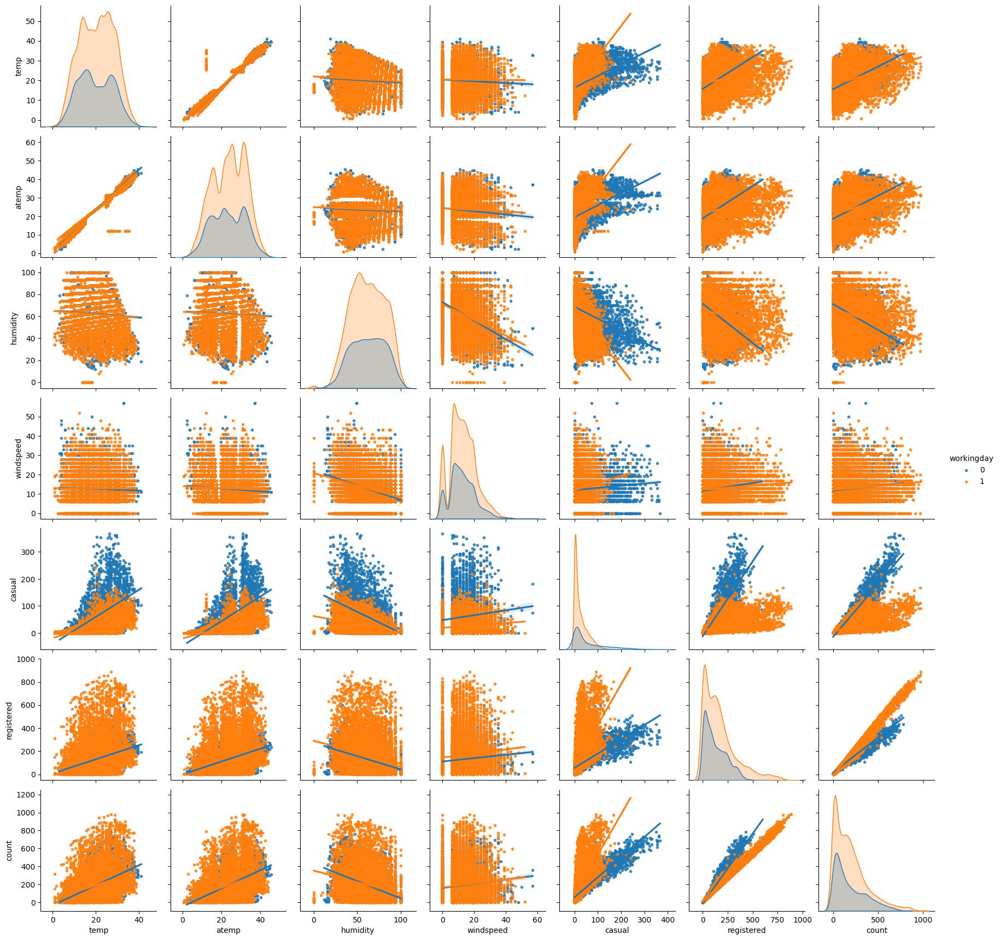

In [130]:
sns.pairplot(data = df, kind = 'reg',hue = 'workingday',markers = '.')
plt.show()

### Summery
* Out of every 100 users, around 19 are casual users and 81 are registered users.
* There is a seasonal pattern in the count of rental bikes, with higher demand during the spring and summer months, a slight decline in the fall, and a further decrease in the winter months.
* More than 80 % of the time, the temperature is less than 28 degrees Celsius.
* More than 80 % of the time, the humidity value is greater than 40. Thus for most of the time, humidity level varies from optimum to too moist.
* More than 85 % of the total, windspeed data has a value of less than 20.
* The count of total rental bikes is the highest in the clear and cloudy weather, followed by the misty weather and rainy weather. There are very few records for extreme weather conditions.
* The mean hourly count of the total rental bikes is statistically similar for both working and non- working days.
* There is statistically significant dependency of weather and season based on the hourly total number of bikes rented.
* The hourly total number of rental bikes is statistically different for different weathers.
* There is no statistically significant dependency of weather 1, 2, 3 on season based on the average hourly total number of bikes rented.
* The hourly total number of rental bikes is statistically different for different seasons.


### Recommendations
1. **Tailoring Marketing Strategies to Seasonal Demand**: Yulu can optimize its marketing efforts by aligning promotions with seasonal patterns. By emphasizing bike rentals during the spring and summer months when demand is higher, the company can attract more customers. Offering seasonal discounts and special packages during these periods can further entice potential users to choose Yulu for their biking needs.

2. **Flexible Pricing Based on Time**: Implementing time-based pricing can be a smart move for Yulu. By adjusting rental rates to be lower during off-peak hours and higher during peak hours, the company can encourage customers to rent bikes at less busy times. This strategy helps to balance demand throughout the day and ensures better resource utilization.

3. **Weather-Influenced Marketing Campaigns**: Yulu can harness the power of weather data to enhance its marketing efforts. Weather-based promotions targeting customers during clear and cloudy weather, which typically sees higher rental counts, can be an effective way to attract more users. By offering weather-specific discounts, Yulu can capitalize on favourable conditions to increase rentals.

4. **Personalized Strategies for User Segmentation**: Recognizing the distinction between registered and casual users, Yulu can customize marketing strategies accordingly. Loyalty programs, exclusive offers, and personalized recommendations can be tailored to registered users to foster repeat business. For casual users, emphasizing the convenience and benefits of bike rentals for occasional use can be more persuasive.

5. **Optimizing Inventory Management**: Careful analysis of demand patterns during different months enables Yulu to optimize its bike inventory. Adjusting inventory levels during lower demand months and ensuring sufficient bikes are available during peak periods helps to maintain cost-efficiency and meet customer demands.

6. **Enhancing Customer Comfort and Experience**: In regions with high humidity and temperatures below 28 degrees Celsius, Yulu can focus on providing amenities like umbrellas, rain jackets, and water bottles to enhance customer comfort. A positive customer experience can lead to increased satisfaction and loyalty.

7. **Collaborating with Weather Services**: Partnering with weather services to provide real-time weather updates can give Yulu an edge in marketing. Incorporating weather information into their promotions and rental app can attract users who prefer specific weather conditions for biking.

8. **Proactive Seasonal Bike Maintenance**: By conducting thorough seasonal bike maintenance checks, Yulu ensures that its bike fleet is in top condition before peak seasons. Regular inspections and servicing throughout the year prevent breakdowns and improve customer satisfaction.

9. **Emphasizing Customer Feedback and Reviews**: Encouraging customers to share feedback and reviews about their biking experiences can provide valuable insights. This feedback can help identify areas for improvement and enable Yulu to tailor its services to better meet customer expectations.

10. **Leveraging Social Media for Engagement**: Utilizing social media platforms, Yulu can showcase captivating visuals of biking experiences in different weather conditions, share customer testimonials, and engage with potential customers through interactive posts and contests. Targeted advertising campaigns can further expand their reach and bookings.

11. **Promoting Sustainability with Special Occasion Discounts**: Yulu's commitment to sustainable solutions for vehicular pollution can be highlighted through special occasion discounts on significant environmental dates like Zero Emissions Day, Earth Day, and World Environment Day. These promotions can attract new users who are passionate about eco-friendly transportation options.